## MM single-cell RNA-seq analysis data (clustering, cell type annotations and biomarker identification)


In [1]:
#pip uninstall --yes torchaudio torch

In [2]:
#pip install torch==2.0.1 torchvision torchaudio==2.0.2


In [3]:
#pip install scvi-tools 

### Installation & Importing Packages

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import anndata
import torch
import scvi
import matplotlib.pyplot as plt
%matplotlib inline

C:\Users\HP\AppData\Local\Programs\Python\Python311\Lib\site-packages\torchaudio\backend\utils.py:74: UserWarning: No audio backend is available.
  warnings.warn("No audio backend is available.")
C:\Users\HP\AppData\Local\Programs\Python\Python311\Lib\site-packages\scvi\_settings.py:63: UserWarning: Since v1.0.0, scvi-tools no longer uses a random seed by default. Run `scvi.settings.seed = 0` to reproduce results from previous versions.
  self.seed = seed
C:\Users\HP\AppData\Local\Programs\Python\Python311\Lib\site-packages\scvi\_settings.py:70: UserWarning: Setting `dl_pin_memory_gpu_training` is deprecated in v1.0 and will be removed in v1.1. Please pass in `pin_memory` to the data loaders instead.
  self.dl_pin_memory_gpu_training = (


In [2]:
scvi.settings.seed = 0
print("Last run with scvi-tools version:", scvi.__version__)

Global seed set to 0


Last run with scvi-tools version: 1.0.3


### scanpy figure and error settings

In [3]:
sc.settings.verbosity = 3             # verbosity: errors (0),                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                   (1), info (2), hints (3)
sc.logging.print_header()
#sc.settings.set_figure_params(dpi=80, facecolor='white')

C:\Users\HP\AppData\Local\Programs\Python\Python311\Lib\site-packages\umap\distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
C:\Users\HP\AppData\Local\Programs\Python\Python311\Lib\site-packages\umap\distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
C:\Users\HP\AppData\Local\Programs\Python\Python311\Lib\si

scanpy==1.9.3 anndata==0.9.1 umap==0.5.3 numpy==1.23.4 scipy==1.10.1 pandas==2.0.1 scikit-learn==1.2.2 statsmodels==0.14.0 python-igraph==0.10.8 pynndescent==0.5.10


## Data Load

In [4]:
adata = sc.read("Myeloma.h5ad")
adata

AnnData object with n_obs × n_vars = 10000 × 19203
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'id', 'age', 'gender', 'stage', 'tissue', 'organism', 'treatment', 'study_id', 'sample_id', 'treatment_type', 'substage', 'subID'
    var: 'features'

In [5]:
adata.obs


,orig.ident,nCount_RNA,nFeature_RNA,id,age,gender,stage,tissue,organism,treatment,study_id,sample_id,treatment_type,substage,subID
AAAGCAAGTTCTGGTA-1_1_1,SeuratProject,854,342,1,81,Male,MGUS,Bone Marrow,Human,ND,GSE124310,GSM3528753,ND,ND,NA
AAAGTAGTCACGCATA-1_1_1,SeuratProject,724,386,1,81,Male,MGUS,Bone Marrow,Human,ND,GSE124310,GSM3528753,ND,ND,NA
AACGTTGTCGACCAGC-1_1_1,SeuratProject,2574,1035,1,81,Male,MGUS,Bone Marrow,Human,ND,GSE124310,GSM3528753,ND,ND,NA
ACCGTAAAGTCGTACT-1_1_1,SeuratProject,1669,652,1,81,Male,MGUS,Bone Marrow,Human,ND,GSE124310,GSM3528753,ND,ND,NA
ACTTACTAGGTGGGTT-1_1_1,SeuratProject,1748,599,1,81,Male,MGUS,Bone Marrow,Human,ND,GSE124310,GSM3528753,ND,ND,NA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTACGCCGTAATACCC-1_27_8,SeuratProject,4799,1782,27,ND,Male,MM,Bone Marrow,Human,treated,GSE217245,GSM6710037,ND,RRMM,NA
TTCTGTACAGGTGAGT-1_27_8,SeuratProject,8611,2448,27,ND,Male,MM,Bone Marrow,Human,treated,GSE217245,GSM6710037,ND,RRMM,NA
TTGAACGAGAGCTGAC-1_27_8,SeuratProject,524,377,27,ND,Male,MM,Bone Marrow,Human,treated,GSE217245,GSM6710037,ND,RRMM,NA
TTTACTGAGGACCCAA-1_27_8,SeuratProject,3784,1561,27,ND,Male,MM,Bone Marrow,Human,treated,GSE217245,GSM6710037,ND,RRMM,NA


In [5]:
adata.obs.stage.value_counts()

stage
MM                  4891
NA                  1853
Healthy              808
MUGS                 574
SMM                  334
                     324
MGUS                 280
ND                   261
Multiple Myeloma     240
SMMh                 171
SMMl                 126
AL                   121
MGUS-MGRS             17
Name: count, dtype: int64

In [9]:
adata.obs.replace("Multiple Myeloma", "MM", inplace=True)
adata.obs.replace("MUGS", "MGUS", inplace=True)
adata.obs.stage.replace("", "ND", inplace=True)

In [17]:
adata.obs.stage.value_counts()

stage
MM            5131
NA            1853
MGUS           854
Healthy        808
ND             585
SMM            334
SMMh           171
SMMl           126
AL             121
MGUS-MGRS       17
Name: count, dtype: int64

In [11]:
adata.obs.replace("Homo sapiens", "Human", inplace=True)


In [16]:
adata.obs.stage.replace("", "ND", inplace=True)


In [12]:
adata.obs.organism.value_counts()

organism
Human    7886
NA       1853
ND        261
Name: count, dtype: int64

## Data Filteration

In [6]:
adata.obs["subID"].value_counts()

subID
NA         8123
AB6274       19
AB6063       19
AB5971       17
AB5982       17
           ... 
AB6482        3
AB6256        3
AB6671        2
AB10329       2
AB8116        1
Name: count, Length: 214, dtype: int64

In [7]:
adata.obs["sample_id"].value_counts()


sample_id
NA            3443
GSM6710009     196
GSM6709993     143
GSM6710015     135
GSM6710023     126
              ... 
GSM3272444       2
GSM3272496       2
GSM5813742       1
GSM5813743       1
GSM5813732       1
Name: count, Length: 277, dtype: int64

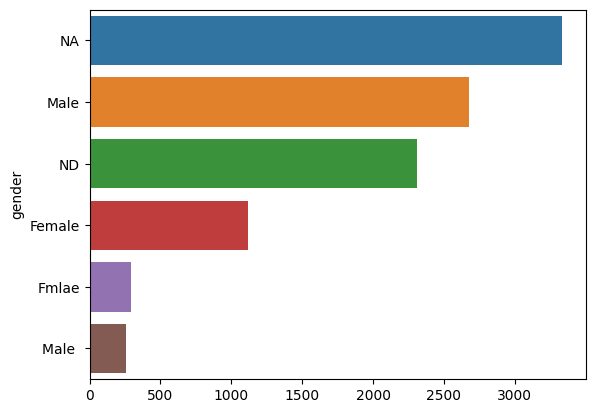

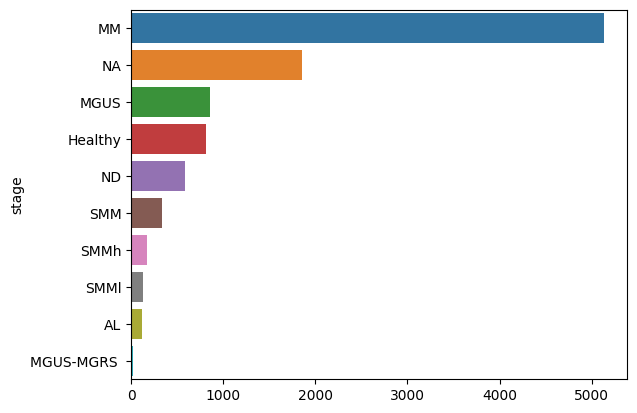

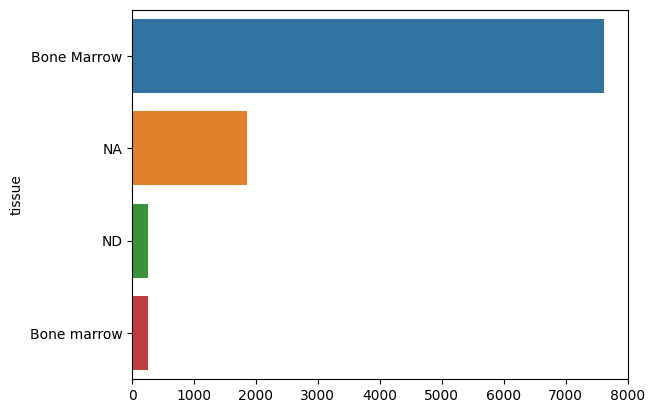

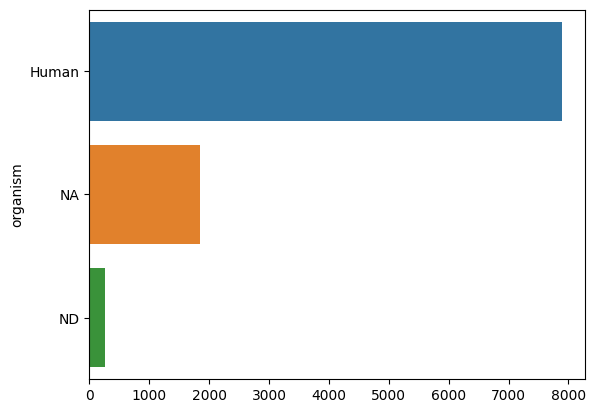

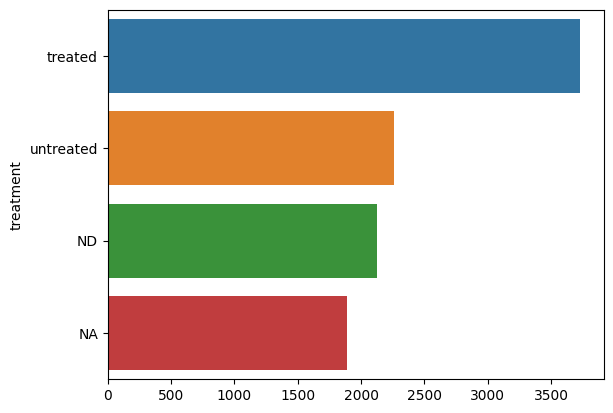

C:\Users\HP\AppData\Local\Programs\Python\Python311\Lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


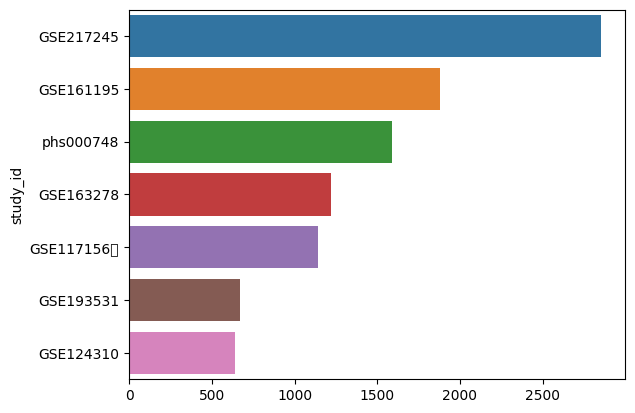

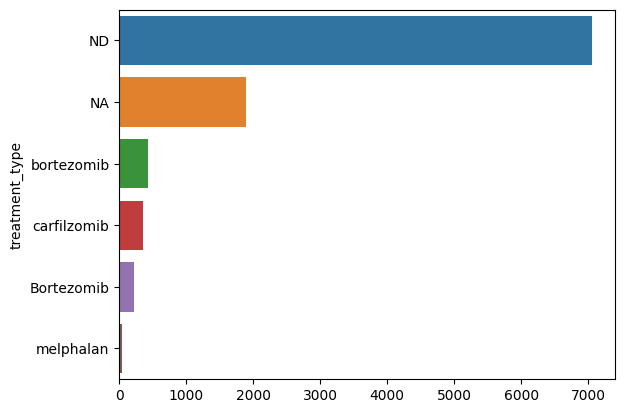

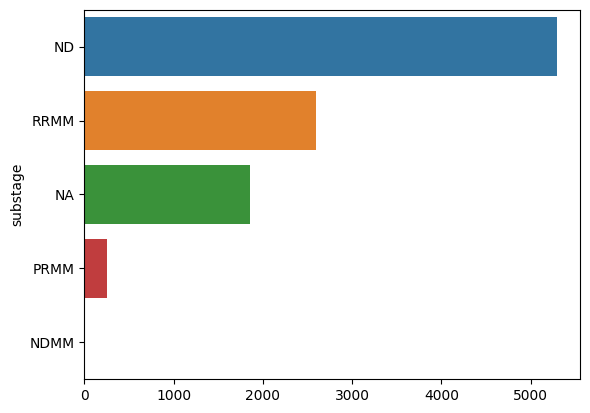

In [18]:
import seaborn as sns
#sns.set_style("dark")
for col in adata.obs.columns[5:]:
    if col in ["sample_id", "subID"]:
        continue
    ct = adata.obs[col].value_counts()
    sns.barplot(x= list(ct),  y=ct.index)
    plt.show()

In [19]:
for col in adata.obs.columns:
    print(col, "====>", sum(adata.obs[col]=="NA"))
    

orig.ident ====> 0
nCount_RNA ====> 0
nFeature_RNA ====> 0
id ====> 0
age ====> 2112
gender ====> 3332
stage ====> 1853
tissue ====> 1853
organism ====> 1853
treatment ====> 1890
study_id ====> 0
sample_id ====> 3443
treatment_type ====> 1890
substage ====> 1853
subID ====> 8123


In [20]:
## Remove NA and ND values
adata = adata[adata.obs.organism != "NA"]
adata = adata[adata.obs["organism"]!="ND"]
adata


View of AnnData object with n_obs × n_vars = 7886 × 19203
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'id', 'age', 'gender', 'stage', 'tissue', 'organism', 'treatment', 'study_id', 'sample_id', 'treatment_type', 'substage', 'subID'
    var: 'features'

In [21]:
for col in adata.obs.columns:
    print(col, "====>", sum(adata.obs[col]=="NA"))
    

orig.ident ====> 0
nCount_RNA ====> 0
nFeature_RNA ====> 0
id ====> 0
age ====> 259
gender ====> 1479
stage ====> 0
tissue ====> 0
organism ====> 0
treatment ====> 37
study_id ====> 0
sample_id ====> 1590
treatment_type ====> 37
substage ====> 0
subID ====> 7627


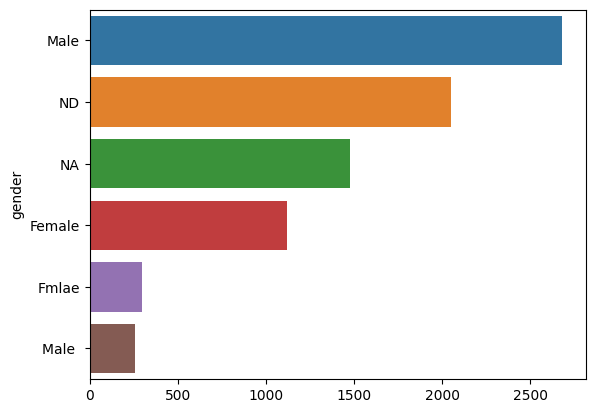

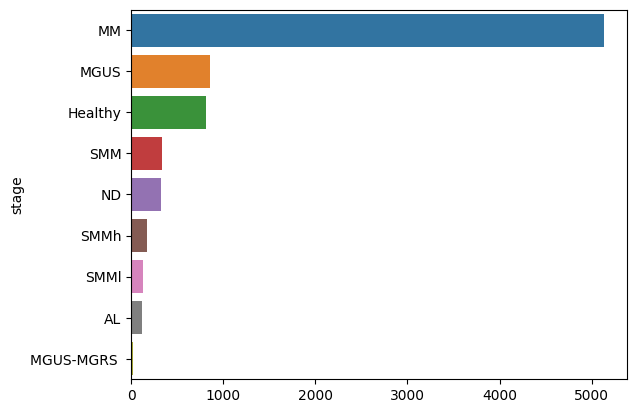

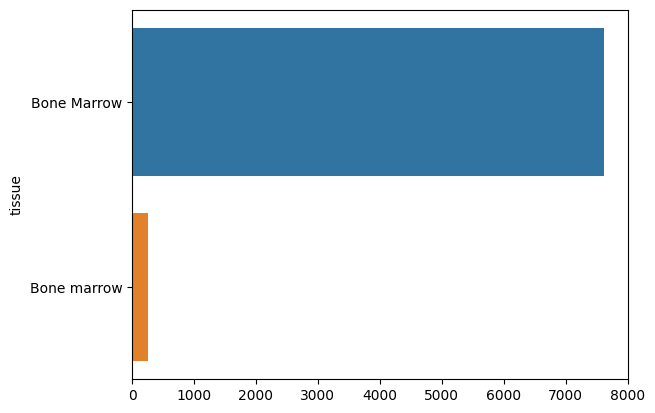

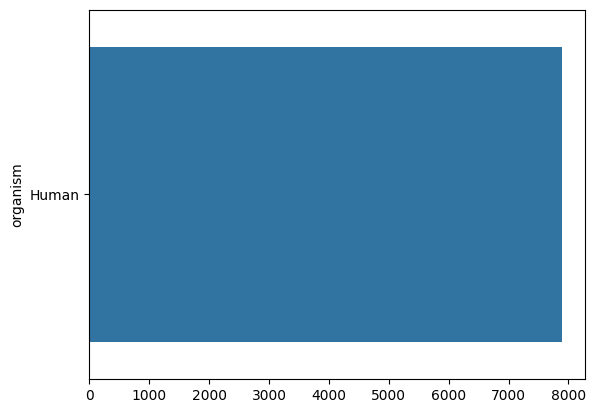

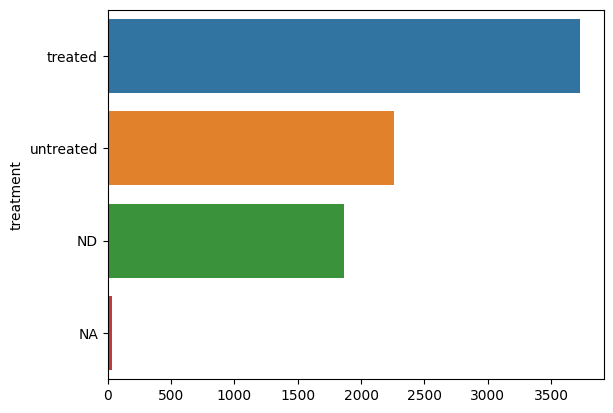

C:\Users\HP\AppData\Local\Programs\Python\Python311\Lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


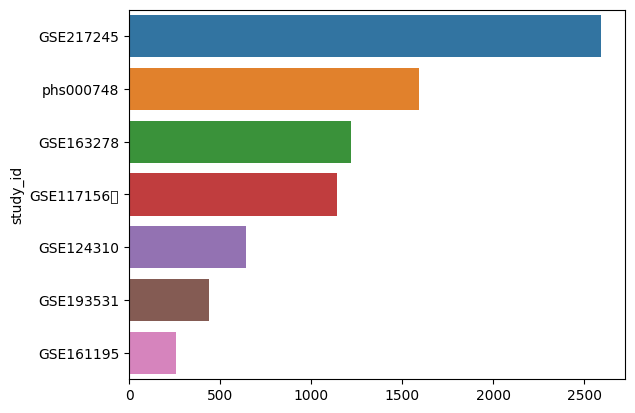

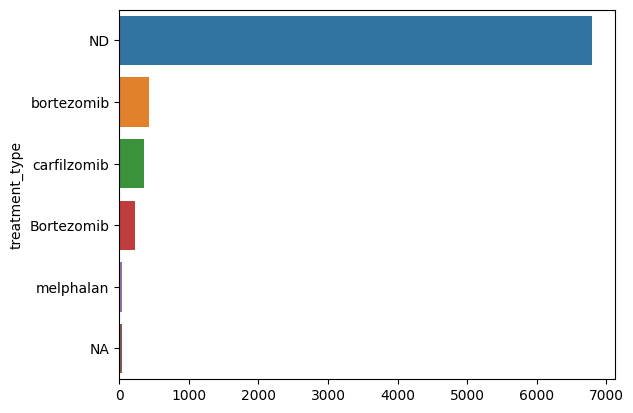

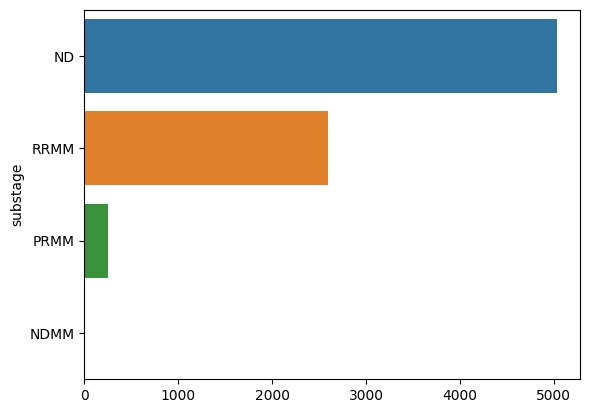

In [22]:
for col in adata.obs.columns[5:]:
    if col in ["sample_id", "subID"]:
        continue
    ct = adata.obs[col].value_counts()
    #ct.plot(kind="bar", grid=False)
    sns.barplot(x= list(ct),  y=ct.index)
    plt.show()
    

In [16]:
adata

View of AnnData object with n_obs × n_vars = 7886 × 19203
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'id', 'age', 'gender', 'stage', 'tissue', 'organism', 'treatment', 'study_id', 'sample_id', 'treatment_type', 'substage', 'subID'
    var: 'features'

In [13]:
# mitochondrial genes
adata.var["mt"] = adata.var_names.str.startswith("MT-")
# ribosomal genes
adata.var["ribo"] = adata.var_names.str.startswith(("RPS", "RPL"))
# hemoglobin genes.
adata.var["hb"] = adata.var_names.str.contains(("^HB[^(P)]"))

C:\Users\HP\AppData\Local\Temp\ipykernel_5676\3567909526.py:2: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var["mt"] = adata.var_names.str.startswith("MT-")


In [14]:
sc.pp.calculate_qc_metrics(
    adata, qc_vars=["mt", "ribo", "hb"], inplace=True, percent_top=[20], log1p=False
)


In [15]:
low_q = adata.obs.iloc[:, -5:]
low_q.head()

,pct_counts_mt,total_counts_ribo,pct_counts_ribo,total_counts_hb,pct_counts_hb
AAAGCAAGTTCTGGTA-1_1_1,4.683841,490.0,57.377049,0.0,0.000000
AAAGTAGTCACGCATA-1_1_1,33.425414,48.0,6.629834,0.0,0.000000
AACGTTGTCGACCAGC-1_1_1,7.498057,608.0,23.620824,0.0,0.000000
ACCGTAAAGTCGTACT-1_1_1,7.070102,695.0,41.641702,0.0,0.000000
ACTTACTAGGTGGGTT-1_1_1,4.176201,923.0,52.803204,1.0,0.057208


In [16]:
sum(low_q["pct_counts_mt"]<20)

7407

In [17]:
sum(low_q["pct_counts_ribo"]<60)

7725

In [18]:
proj= adata.obs.study_id.value_counts()
proj

study_id
GSE217245      2594
phs000748      1590
GSE163278      1220
GSE117156\t    1142
GSE124310       643
GSE193531       438
GSE161195       259
Name: count, dtype: int64

C:\Users\HP\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\preprocessing\_qc.py:135: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[obs_metrics.columns] = obs_metrics


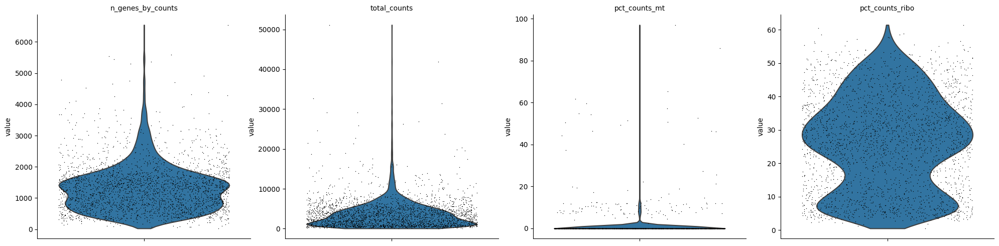

C:\Users\HP\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\preprocessing\_qc.py:135: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[obs_metrics.columns] = obs_metrics


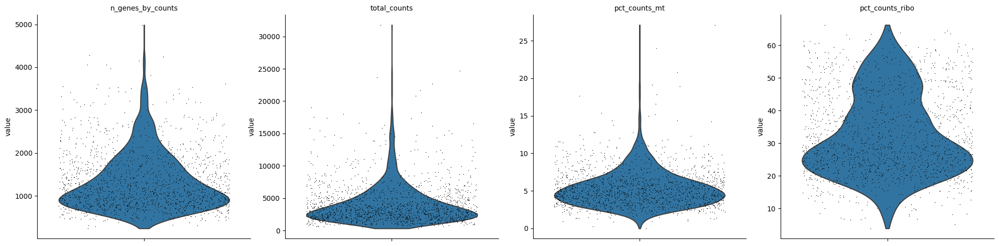

C:\Users\HP\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\preprocessing\_qc.py:135: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[obs_metrics.columns] = obs_metrics


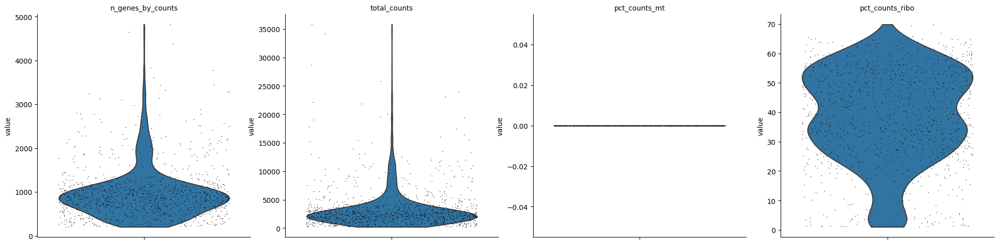

C:\Users\HP\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\preprocessing\_qc.py:135: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[obs_metrics.columns] = obs_metrics


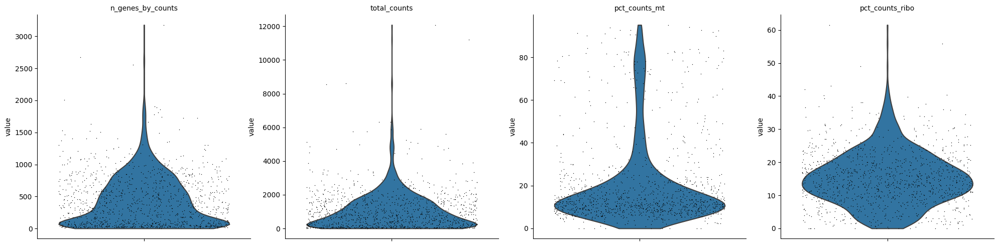

C:\Users\HP\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\preprocessing\_qc.py:135: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[obs_metrics.columns] = obs_metrics


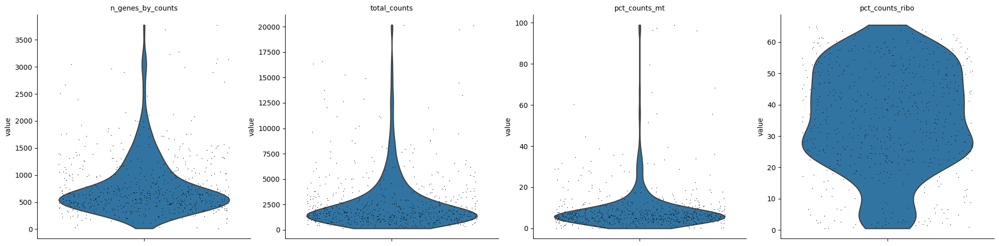

C:\Users\HP\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\preprocessing\_qc.py:135: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[obs_metrics.columns] = obs_metrics


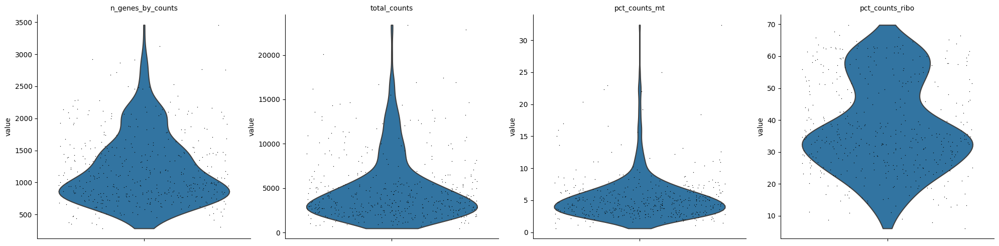

C:\Users\HP\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\preprocessing\_qc.py:135: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[obs_metrics.columns] = obs_metrics


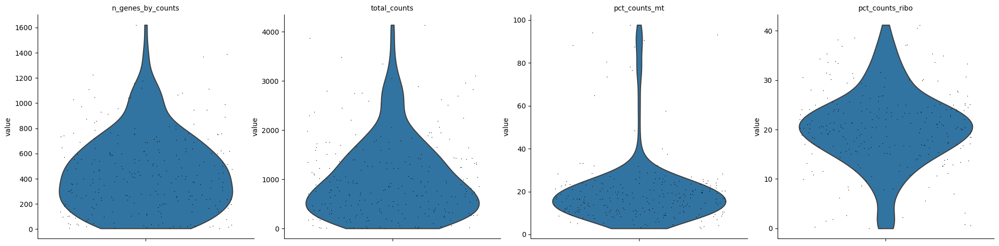

In [19]:
for st_id in proj.index:
    ad_1 = adata[adata.obs.study_id==st_id] 
    sc.pp.calculate_qc_metrics(
    ad_1, qc_vars=["mt", "ribo", "hb"], inplace=True, percent_top=[20], log1p=False
)
    sc.pl.violin(ad_1, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt', 'pct_counts_ribo'], jitter=0.4, multi_panel=True)

(array([7.773e+03, 1.100e+01, 5.000e+00, 5.000e+00, 2.000e+00, 8.000e+00,
        1.200e+01, 2.100e+01, 2.300e+01, 2.600e+01]),
 array([ 0.        ,  9.49517867, 18.99035735, 28.48553602, 37.98071469,
        47.47589336, 56.97107204, 66.46625071, 75.96142938, 85.45660805,
        94.95178673]),
 <BarContainer object of 10 artists>)

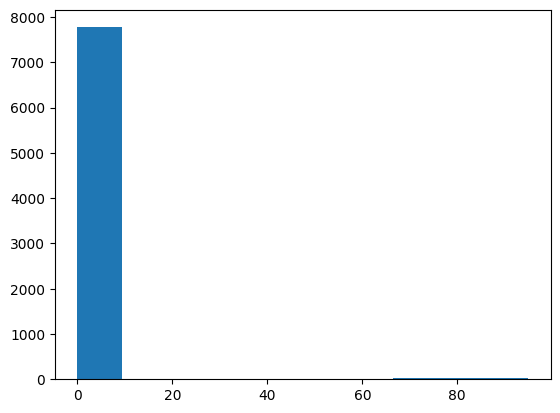

In [20]:
plt.hist(low_q["pct_counts_hb"], bins=10)

(array([6587.,  810.,  235.,   65.,   38.,   30.,   31.,   39.,   28.,
          23.]),
 array([ 0.        ,  9.8961039 , 19.79220779, 29.68831169, 39.58441558,
        49.48051948, 59.37662338, 69.27272727, 79.16883117, 89.06493506,
        98.96103896]),
 <BarContainer object of 10 artists>)

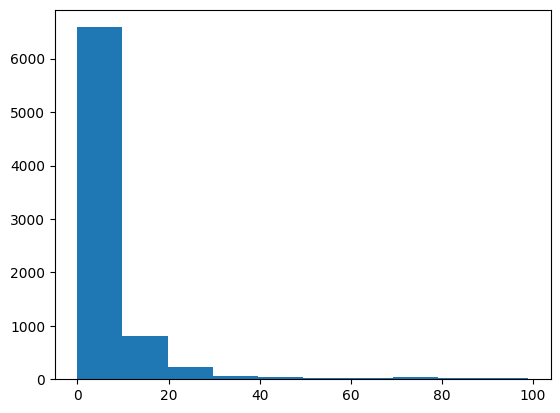

In [21]:
#df_sum = exp_cts+1.sum(axis=1)
plt.hist(low_q["pct_counts_mt"], bins=10)

(array([ 609.,  872., 1062., 1460., 1261.,  898.,  708.,  606.,  343.,
          67.]),
 array([ 0.        ,  6.98571429, 13.97142857, 20.95714286, 27.94285714,
        34.92857143, 41.91428571, 48.9       , 55.88571429, 62.87142857,
        69.85714286]),
 <BarContainer object of 10 artists>)

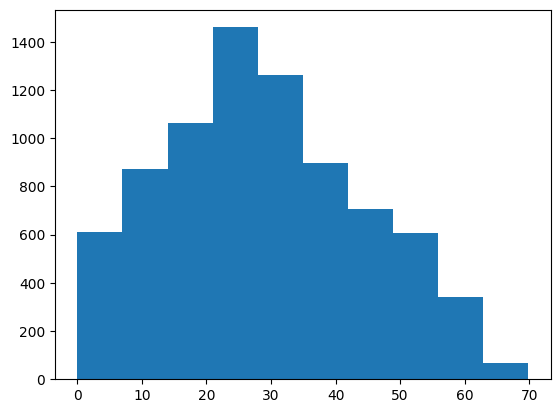

In [22]:
#df_sum = exp_cts+1.sum(axis=1)
plt.hist(low_q["pct_counts_ribo"], bins=10)

In [23]:
adata2 = adata[(adata.obs.pct_counts_mt<20) & (adata.obs.pct_counts_ribo<62) & (adata.obs.pct_counts_hb<1),:]
adata2

View of AnnData object with n_obs × n_vars = 6864 × 19203
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'id', 'age', 'gender', 'stage', 'tissue', 'organism', 'treatment', 'study_id', 'sample_id', 'treatment_type', 'substage', 'subID', 'n_genes_by_counts', 'total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb'
    var: 'features', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

In [24]:
sc.pp.filter_cells(adata2, min_genes=200) #get rid of cells with fewer than 200 genes
sc.pp.filter_genes(adata2,min_cells=3) #get rid of genes that are found in fewer than 3 cells
adata2

filtered out 240 cells that have less than 200 genes expressed


C:\Users\HP\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\preprocessing\_simple.py:140: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['n_genes'] = number


filtered out 4451 genes that are detected in less than 3 cells


AnnData object with n_obs × n_vars = 6624 × 14752
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'id', 'age', 'gender', 'stage', 'tissue', 'organism', 'treatment', 'study_id', 'sample_id', 'treatment_type', 'substage', 'subID', 'n_genes_by_counts', 'total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'n_genes'
    var: 'features', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells'

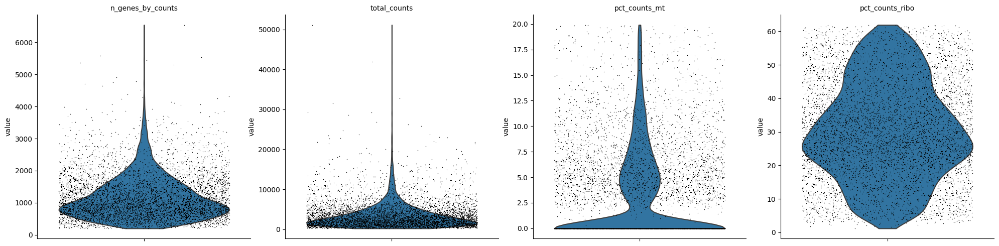

In [25]:
sc.pl.violin(adata2, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt', 'pct_counts_ribo'], jitter=0.4, multi_panel=True)

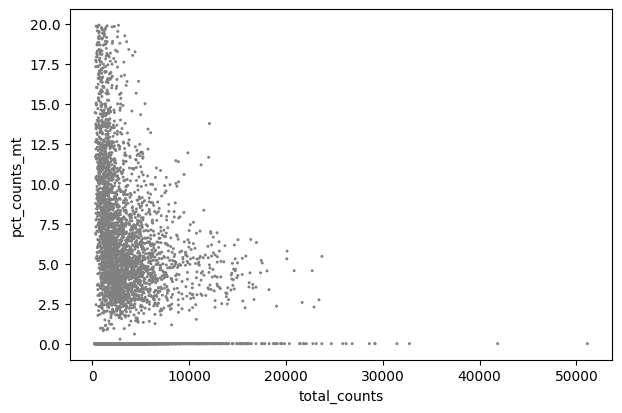

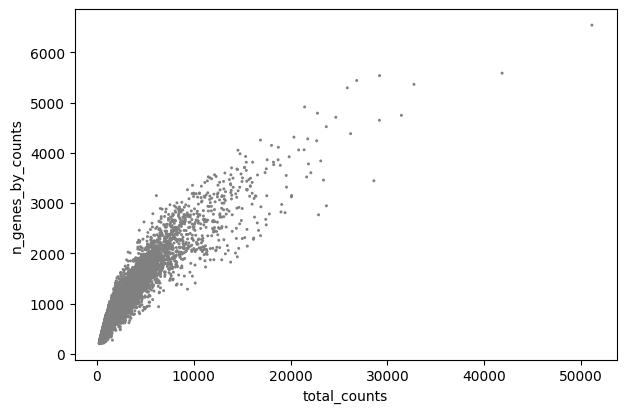

In [26]:
sc.pl.scatter(adata2, x='total_counts', y='pct_counts_mt') 
sc.pl.scatter(adata2, x='total_counts', y='n_genes_by_counts')

In [27]:
adata2 = adata2[adata2.obs.n_genes_by_counts < 4000]
adata2

View of AnnData object with n_obs × n_vars = 6602 × 14752
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'id', 'age', 'gender', 'stage', 'tissue', 'organism', 'treatment', 'study_id', 'sample_id', 'treatment_type', 'substage', 'subID', 'n_genes_by_counts', 'total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'n_genes'
    var: 'features', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells'

In [28]:
adata2 = adata2[:, (adata2.var["mt"]==False) & (adata2.var["ribo"]==False)]
adata2

View of AnnData object with n_obs × n_vars = 6602 × 14639
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'id', 'age', 'gender', 'stage', 'tissue', 'organism', 'treatment', 'study_id', 'sample_id', 'treatment_type', 'substage', 'subID', 'n_genes_by_counts', 'total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'n_genes'
    var: 'features', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells'

In [29]:
adata2.X.sum(axis=1)

matrix([[ 324.],
        [1772.],
        [ 856.],
        ...,
        [ 469.],
        [2728.],
        [ 530.]])

In [30]:
adata2.layers['counts'] = adata2.X.copy()


In [176]:
#adata_raw =  adata2

In [31]:
sc.pp.normalize_total(adata2, target_sum=1e4)

normalizing counts per cell
    finished (0:00:00)


In [32]:
adata2.X.sum(axis = 1)

matrix([[10000.],
        [10000.],
        [10000.],
        ...,
        [10000.],
        [10000.],
        [10000.]])

In [33]:
sc.pp.log1p(adata2) #change to log counts

In [34]:
adata2.X.sum(axis = 1)

matrix([[ 912.88126384],
        [2014.5895429 ],
        [1524.16267927],
        ...,
        [1117.8943298 ],
        [2649.19276826],
        [1386.32595701]])

normalizing counts per cell
    finished (0:00:00)


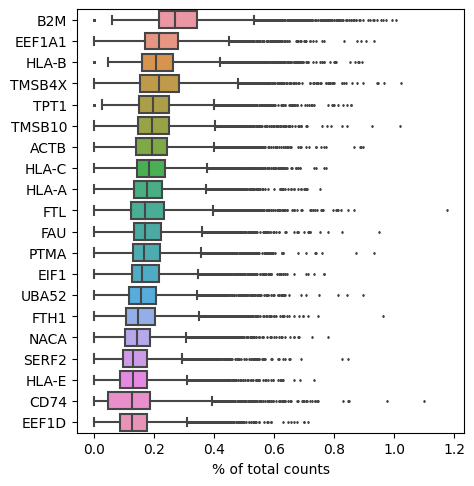

In [35]:
sc.pl.highest_expr_genes(adata2, n_top=20, )


In [36]:
adata2

AnnData object with n_obs × n_vars = 6602 × 14639
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'id', 'age', 'gender', 'stage', 'tissue', 'organism', 'treatment', 'study_id', 'sample_id', 'treatment_type', 'substage', 'subID', 'n_genes_by_counts', 'total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'n_genes'
    var: 'features', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells'
    uns: 'log1p'
    layers: 'counts'

In [37]:
adata2.raw =  adata2

### HVG

In [38]:
sc.pp.highly_variable_genes(adata2) #these are default values
#minimum mean expression threshold
#max mean expression threshold
#minimum dispersion threshold.

extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [39]:
adata2.var

,features,mt,ribo,hb,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts,n_cells,highly_variable,means,dispersions,dispersions_norm
TSPAN6,TSPAN6,False,False,False,39,0.005453,99.505453,43.0,36,False,0.032021,2.441292,0.252288
DPM1,DPM1,False,False,False,915,0.136825,88.397160,1079.0,858,False,0.530085,2.197504,-0.957503
SCYL3,SCYL3,False,False,False,224,0.029546,97.159523,233.0,204,False,0.143347,2.225752,-0.204289
C1orf112,C1orf112,False,False,False,80,0.011032,98.985544,87.0,73,False,0.055738,2.432210,0.233050
FGR,FGR,False,False,False,1125,0.239538,85.734213,1889.0,1065,False,0.768700,2.309666,-0.527751
...,...,...,...,...,...,...,...,...,...,...,...,...,...
F8A1,F8A1,False,False,False,84,0.011793,98.934821,93.0,66,False,0.064654,2.284713,-0.079393
H2AC18,H2AC18,False,False,False,8,0.001014,99.898554,8.0,8,False,0.004676,1.786433,-1.134898
H2AC19,H2AC19,False,False,False,26,0.003931,99.670302,31.0,26,False,0.013934,1.917914,-0.856382
HOMEZ,HOMEZ,False,False,False,86,0.011032,98.909460,87.0,78,False,0.055152,2.411590,0.189370


In [45]:
#adata2_raw = adata2.copy #save raw data before processing values and further filtering

In [46]:
#adata2_raw

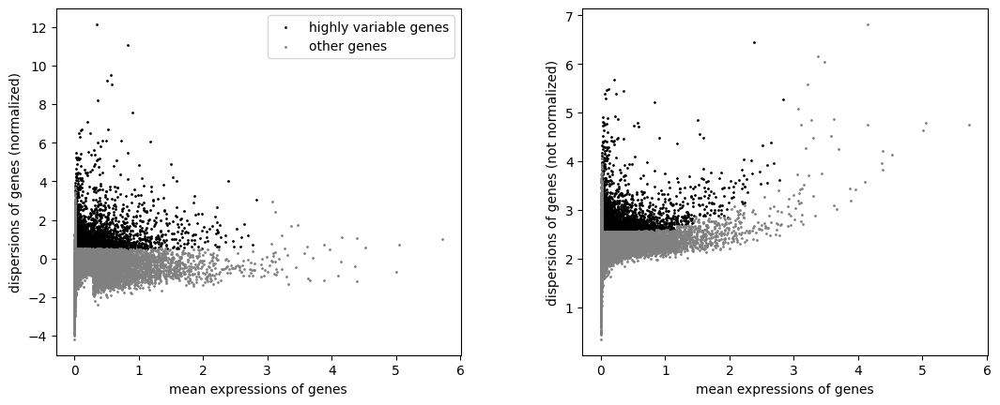

In [40]:
sc.pl.highly_variable_genes(adata2)

In [41]:
adata2 = adata2[:, adata2.var.highly_variable] #filter highly variable


In [42]:
adata2.X.min()

0.0

In [43]:
print(sum(adata2.var["mt"]==True))
print(sum(adata2.var["ribo"]==True))

0
0


In [44]:
# The session crashed
sc.pp.regress_out(adata2, ['total_counts', 'pct_counts_mt', "pct_counts_ribo"]) #Regress out effects of total counts per cell and the percentage of mitochondrial genes expressed

regressing out ['total_counts', 'pct_counts_mt', 'pct_counts_ribo']
    sparse input is densified and may lead to high memory use
    finished (0:00:52)


In [45]:
sc.pp.scale(adata2, max_value=10) #scale each gene to unit variance

In [46]:
print(adata2.raw.X.min(), adata2.raw.X.max())
print(adata2.X.min(), adata2.X.max())

0.0 8.369727404780072
-3.4021489676200507 10.0


In [47]:
adata2

AnnData object with n_obs × n_vars = 6602 × 2974
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'id', 'age', 'gender', 'stage', 'tissue', 'organism', 'treatment', 'study_id', 'sample_id', 'treatment_type', 'substage', 'subID', 'n_genes_by_counts', 'total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'n_genes'
    var: 'features', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg'
    layers: 'counts'

## Dimensionality Reduction by PCA

In [48]:
sc.tl.pca(adata2, svd_solver='arpack')

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:05)


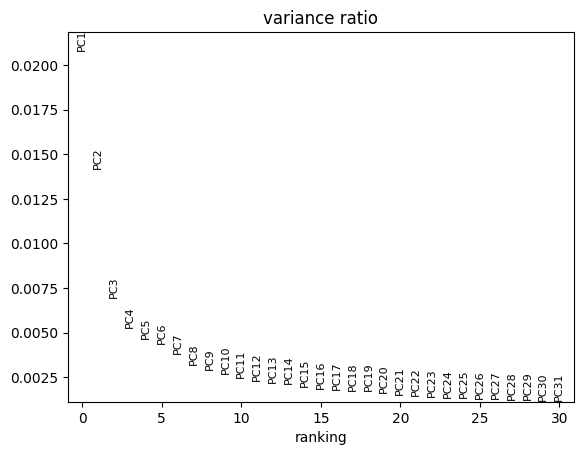

In [49]:
sc.pl.pca_variance_ratio(adata2)

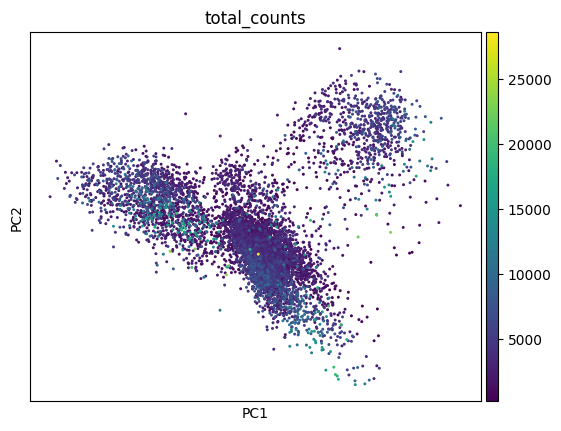

In [50]:
# scatter plot in the PCA coordinates
sc.pl.pca_scatter(adata2, color="total_counts")

##Computing the neighborhood graph


In [51]:
sc.pp.neighbors(adata2, n_neighbors=10, n_pcs=20)


computing neighbors
    using 'X_pca' with n_pcs = 20
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:09)


### Embedding the neighborhood graph
Non_linear Dimensionality Reduction by UMAP


In [52]:
sc.tl.umap(adata2)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:23)


C:\Users\HP\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  cax = scatter(


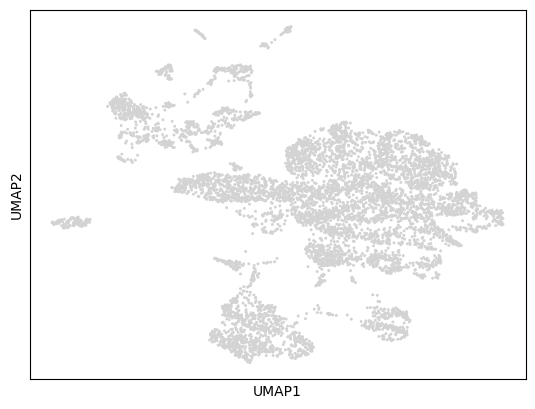

In [53]:
sc.pl.umap(adata2)

### Clustering the neigborhood graph

running Leiden clustering
    finished: found 20 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


C:\Users\HP\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


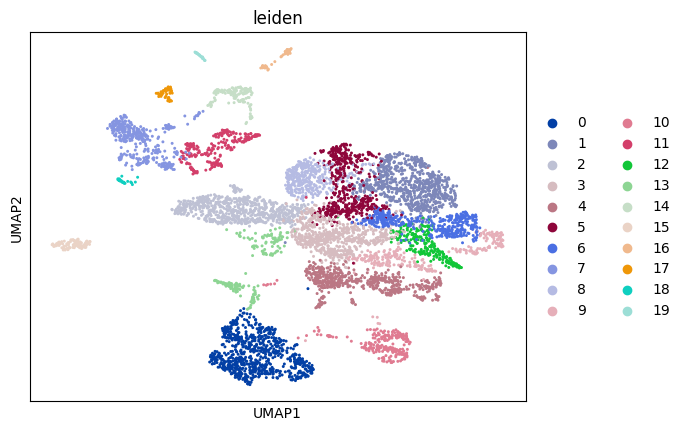

In [56]:
sc.tl.leiden(adata2, resolution = 0.4)
sc.pl.umap(adata2, color=['leiden'])

C:\Users\HP\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


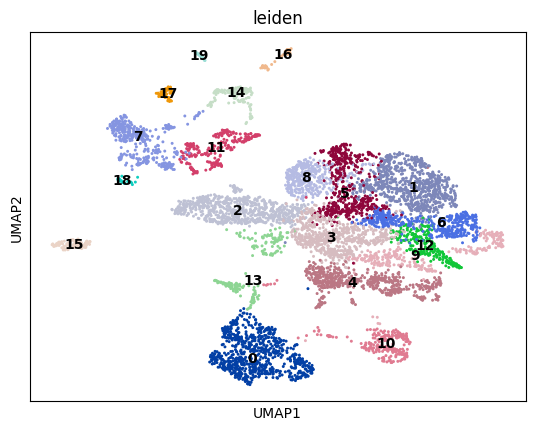

In [57]:
sc.pl.umap(
    adata2,
    color=["leiden"],
    legend_loc="on data",
)

C:\Users\HP\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
C:\Users\HP\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
C:\Users\HP\AppData\Local\Programs\Python\Python311\Lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


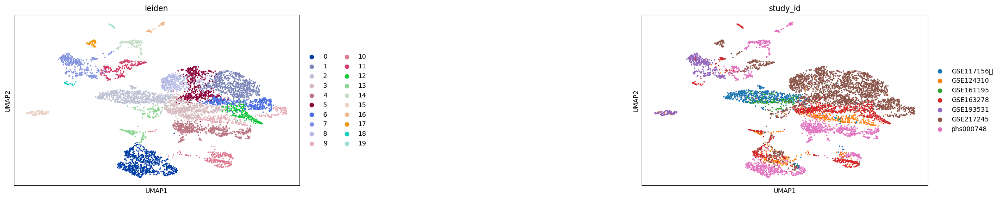

In [58]:
sc.pl.umap(adata2, color=["leiden", "study_id"], wspace=1)


### Integration using ScVI

In [59]:
adata2

AnnData object with n_obs × n_vars = 6602 × 2974
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'id', 'age', 'gender', 'stage', 'tissue', 'organism', 'treatment', 'study_id', 'sample_id', 'treatment_type', 'substage', 'subID', 'n_genes_by_counts', 'total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'n_genes', 'leiden'
    var: 'features', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'study_id_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

In [125]:
#adata_hvg = adata2[:, adata2.var["highly_variable"]].copy()
#adata_hvg

In [60]:
adata_scvi = adata2.copy()

In [61]:
scvi.model.SCVI.setup_anndata(adata_scvi, layer="counts", batch_key="study_id")
adata_scvi

No GPU/TPU found, falling back to CPU. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)


AnnData object with n_obs × n_vars = 6602 × 2974
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'id', 'age', 'gender', 'stage', 'tissue', 'organism', 'treatment', 'study_id', 'sample_id', 'treatment_type', 'substage', 'subID', 'n_genes_by_counts', 'total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'n_genes', 'leiden', '_scvi_batch', '_scvi_labels'
    var: 'features', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'study_id_colors', '_scvi_uuid', '_scvi_manager_uuid'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

In [62]:
model_scvi = scvi.model.SCVI(adata_scvi)
model_scvi

SCVI Model with the following params: 
n_hidden: 128, n_latent: 10, n_layers: 1, dropout_rate: 0.1, dispersion: gene, gene_likelihood: zinb, 
latent_distribution: normal
Training status: Not Trained
Model's adata is minified?: False

In [63]:
model_scvi.view_anndata_setup()

Anndata setup with scvi-tools version 1.0.3.

Setup via `SCVI.setup_anndata` with arguments:

{
│   'layer': 'counts',
│   'batch_key': 'study_id',
│   'labels_key': None,
│   'size_factor_key': None,
│   'categorical_covariate_keys': None,
│   'continuous_covariate_keys': None
}

         Summary Statistics         
┏━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━┓
┃     Summary Stat Key     ┃ Value ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━┩
│         n_batch          │   7   │
│         n_cells          │ 6602  │
│ n_extra_categorical_covs │   0   │
│ n_extra_continuous_covs  │   0   │
│         n_labels         │   1   │
│          n_vars          │ 2974  │
└──────────────────────────┴───────┘

               Data Registry                
┏━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Registry Key ┃    scvi-tools Location    ┃
┡━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│      X       │  adata.layers['counts']   │
│    batch     │ adata.obs['_scvi_batch']  │
│    labels    │ adata.obs['_scvi_labels'] │
└──────────────┴───────────────────────────┘

                    batch State Registry                    
┏━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃    Source Location    ┃ Categories ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['study_id'] │ GSE117156  │          0          │
│                       │ GSE124310  │          1          │
│                       │ GSE161195  │          2          │
│                       │ GSE163278  │          3          │
│                       │ GSE193531  │          4          │
│                       │ GSE217245  │          5          │
│                       │ phs000748  │          6          │
└───────────────────────┴────────────┴─────────────────────┘

                     labels State Registry                      
┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃      Source Location      ┃ Categories ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['_scvi_labels'] │     0      │          0          │
└───────────────────────────┴────────────┴─────────────────────┘

In [64]:
max_epochs_scvi = np.min([round((20000 / adata2.n_obs) * 400), 400])
max_epochs_scvi

400

In [65]:
model_scvi.train()

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Epoch 400/400: 100%|█| 400/400 [1:10:02<00:00,  4.45s/it, v_num=1, train_loss_s

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|█| 400/400 [1:10:02<00:00, 10.51s/it, v_num=1, train_loss_s


In [66]:
adata_scvi.obsm["X_scVI"] = model_scvi.get_latent_representation()


In [67]:
adata_scvi.layers['scvi_normalized'] = model_scvi.get_normalized_expression(library_size = 1e4)

In [68]:
adata_scvi

AnnData object with n_obs × n_vars = 6602 × 2974
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'id', 'age', 'gender', 'stage', 'tissue', 'organism', 'treatment', 'study_id', 'sample_id', 'treatment_type', 'substage', 'subID', 'n_genes_by_counts', 'total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'n_genes', 'leiden', '_scvi_batch', '_scvi_labels'
    var: 'features', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'study_id_colors', '_scvi_uuid', '_scvi_manager_uuid'
    obsm: 'X_pca', 'X_umap', 'X_scVI'
    varm: 'PCs'
    layers: 'counts', 'scvi_normalized'
    obsp: 'distances', 'connectivities'

In [74]:
sc.pp.neighbors(adata_scvi, use_rep="X_scVI")
sc.tl.umap(adata_scvi)
adata_scvi

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:11)


AnnData object with n_obs × n_vars = 6602 × 2974
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'id', 'age', 'gender', 'stage', 'tissue', 'organism', 'treatment', 'study_id', 'sample_id', 'treatment_type', 'substage', 'subID', 'n_genes_by_counts', 'total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'n_genes', 'leiden', '_scvi_batch', '_scvi_labels'
    var: 'features', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'study_id_colors', '_scvi_uuid', '_scvi_manager_uuid'
    obsm: 'X_pca', 'X_umap', 'X_scVI'
    varm: 'PCs'
    layers: 'counts', 'scvi_normalized'
    obsp: 'distances', 'connectivities'

In [75]:
sc.tl.leiden(adata_scvi, resolution=0.8)

running Leiden clustering
    finished: found 18 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


In [233]:
#adata3.layers['scvi_normalized'] = model_scvi.get_normalized_expression(library_size = 1e4)

C:\Users\HP\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
C:\Users\HP\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
C:\Users\HP\AppData\Local\Programs\Python\Python311\Lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


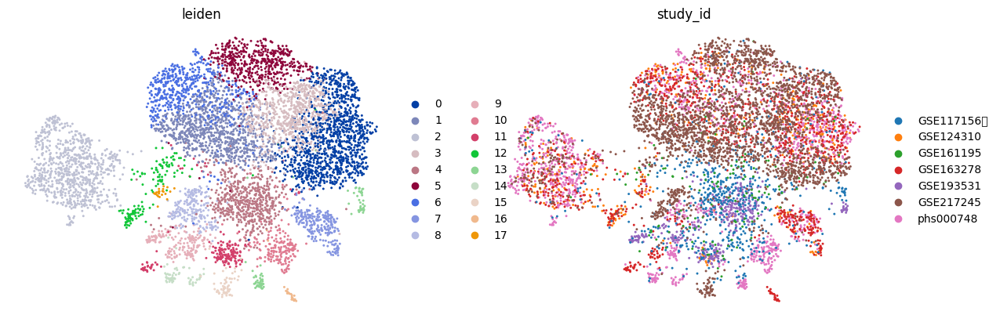

In [76]:
sc.pl.umap(adata_scvi, color = ['leiden', 'study_id'], frameon = False)

In [77]:
adata_scvi.write('MM_adata_inegrated.h5ad',  compression="gzip")

In [61]:
#model_scvi

SCVI Model with the following params: 
n_hidden: 128, n_latent: 10, n_layers: 1, dropout_rate: 0.1, dispersion: gene, gene_likelihood: zinb, 
latent_distribution: normal
Training status: Trained
Model's adata is minified?: False

## Find Markers

In [103]:
#adata_scvi.raw = adata_scvi

In [80]:
#adata_scvi = sc.read("MM_adata_inegrated.h5ad")
#adata_scvi

In [104]:
#adata2

In [59]:
#adata_scvi.uns['log1p']["base"] = None

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:11)


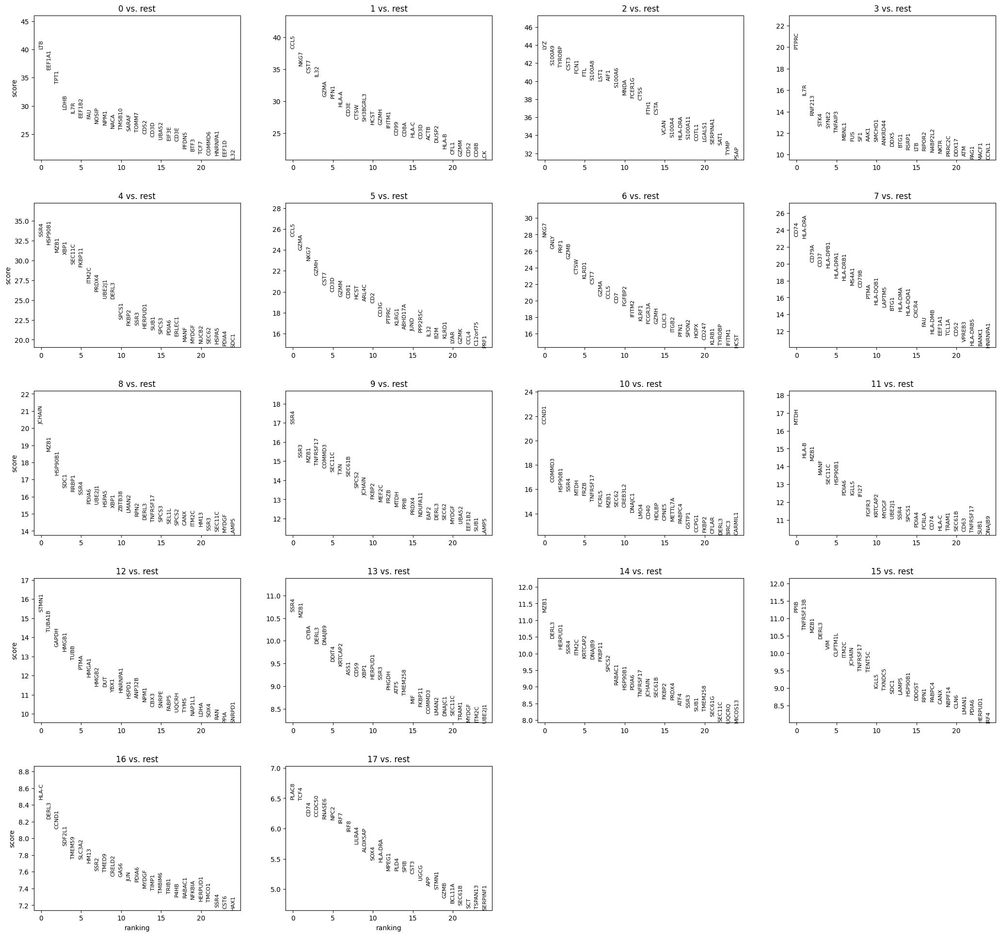

In [81]:
sc.tl.rank_genes_groups(adata_scvi, 'leiden', method='wilcoxon') 
sc.pl.rank_genes_groups(adata_scvi, n_genes=25, sharey=False)

In [82]:
Markers = sc.get.rank_genes_groups_df(adata_scvi, None)
top_genes = Markers[(Markers.pvals_adj < 0.05) & (Markers.logfoldchanges > 0.5)]
top_genes


,group,names,scores,logfoldchanges,pvals,pvals_adj
0,0,LTB,40.133392,4.429915,0.000000e+00,0.000000e+00
1,0,EEF1A1,36.489182,1.814842,1.646188e-291,1.204928e-287
2,0,TPT1,33.946621,1.508995,1.368145e-252,6.676093e-249
3,0,LDHB,29.431383,2.324608,2.179316e-190,7.975751e-187
4,0,IL7R,28.777838,3.402538,4.062928e-182,1.189544e-178
...,...,...,...,...,...,...
248917,17,NDUFV2,3.789284,2.159402,1.510822e-04,3.567245e-02
248918,17,ERCC1,3.768188,3.083509,1.644371e-04,3.820945e-02
248919,17,GAPT,3.760680,5.163891,1.694517e-04,3.875943e-02
248920,17,PARK7,3.739749,1.731198,1.842044e-04,4.148566e-02


In [52]:
#markers_scvi = model_scvi.differential_expression(groupby = 'leiden')
#markers_scvi

In [53]:
#markers_scvi = markers_scvi[(markers_scvi['is_de_fdr_0.05']) & (markers_scvi.lfc_mean > 1)]
#markers_scvi

In [83]:
for i in range(0, 17):
    print("markers for cluster no: ", i)
    top_markers = sc.get.rank_genes_groups_df(adata_scvi, group = str(i)).head(10)
    print(top_markers)
    print("========================================================")

markers for cluster no:  0
    names     scores  logfoldchanges          pvals      pvals_adj
0     LTB  40.133392        4.429915   0.000000e+00   0.000000e+00
1  EEF1A1  36.489182        1.814842  1.646188e-291  1.204928e-287
2    TPT1  33.946621        1.508995  1.368145e-252  6.676093e-249
3    LDHB  29.431383        2.324608  2.179316e-190  7.975751e-187
4    IL7R  28.777838        3.402538  4.062928e-182  1.189544e-178
5  EEF1B2  27.969051        1.687584  3.867364e-172  9.435724e-169
6     FAU  27.772451        1.166771  9.335432e-170  1.952306e-166
7   NOSIP  26.979925        2.898288  2.542541e-160  4.652532e-157
8    NPM1  26.713036        1.740360  3.321352e-157  5.402364e-154
9    NACA  26.053329        1.310385  1.233393e-149  1.805564e-146
markers for cluster no:  1
      names     scores  logfoldchanges          pvals      pvals_adj
0      CCL5  38.234299        5.024028   0.000000e+00   0.000000e+00
1      NKG7  35.591129        4.849282  1.921677e-277  1.406571e-273
2 

    names    scores  logfoldchanges         pvals     pvals_adj
0   HLA-C  8.468246        2.737441  2.491141e-17  3.646781e-13
1   DERL3  8.236430        6.331569  1.774252e-16  1.298664e-12
2   CCND1  8.112900        7.267628  4.942586e-16  2.411817e-12
3  SDF2L1  7.910257        4.562717  2.568575e-15  9.400344e-12
4  TMEM59  7.756396        3.735621  8.737678e-15  2.264710e-11
5  SLC3A2  7.748722        4.392795  9.282233e-15  2.264710e-11
6    HM13  7.710927        3.980917  1.249076e-14  2.612175e-11
7    SSR2  7.612365        3.209544  2.691253e-14  4.895171e-11
8   TMED9  7.597909        4.062530  3.009532e-14  4.895171e-11
9  CRELD2  7.548339        4.540455  4.408428e-14  6.118176e-11


## Manual Cell Type Annotation

In [170]:
#adata3.obs["stage"].value_counts()

In [84]:
marker_genes = {
    "CD14+ Mono": ["FCN1", "CD14"],
    "CD16+ Mono": ["TCF7L2", "FCGR3A", "LYN"],
    "ID2-hi myeloid prog": [
        "CD14",
        "ID2",
        "VCAN",
        "S100A9",
        "CLEC12A",
        "KLF4",
        "PLAUR",
    ],
    "cDC1": ["CLEC9A", "CADM1"],
    "cDC2": [
        "CST3",
        "COTL1",
        "LYZ",
        "DMXL2",
        "CLEC10A",
        "FCER1A",
    ],  # Note: DMXL2 should be negative
    "Normoblast": ["SLC4A1", "SLC25A37", "HBB", "HBA2", "HBA1", "TFRC"],
    "Erythroblast": ["MKI67", "HBA1", "HBB"],
    "Proerythroblast": [
        "CDK6",
        "SYNGR1",
        "HBM",
        "GYPA",
    ],  # Note HBM and GYPA are negative markers
    "NK": ["GNLY", "NKG7", "CD247", "GRIK4", "FCER1G", "TYROBP", "KLRG1", "FCGR3A"],
    "ILC": ["ID2", "PLCG2", "GNLY", "SYNE1"],
    "Lymph prog": [
        "VPREB1",
        "MME",
        "EBF1",
        "SSBP2",
        "BACH2",
        "CD79B",
        "IGHM",
        "PAX5",
        "PRKCE",
        "DNTT",
        "IGLL1",
    ],
    "Naive CD20+ B": ["MS4A1", "IL4R", "IGHD", "FCRL1", "IGHM"],
    "B1 B": [
        "MS4A1",
        "SSPN",
        "ITGB1",
        "EPHA4",
        "COL4A4",
        "PRDM1",
        "IRF4",
        "CD38",
        "XBP1",
        "PAX5",
        "BCL11A",
        "BLK",
        "IGHD",
        "IGHM",
        "ZNF215",
    ],  # Note IGHD and IGHM are negative markers
    "Transitional B": ["MME", "CD38", "CD24", "ACSM3", "MSI2"],
    "Plasma cells": ["MZB1", "HSP90B1", "FNDC3B", "PRDM1", "IGKC", "JCHAIN"],
    "Plasmablast": ["XBP1", "RF4", "PRDM1", "PAX5"],  # Note PAX5 is a negative marker
    "CD4+ T activated": ["CD4", "IL7R", "TRBC2", "ITGB1"],
    "CD4+ T naive": ["CD4", "IL7R", "TRBC2", "CCR7"],
    "CD8+ T": ["CD8A", "CD8B", "GZMK", "GZMA", "CCL5", "GZMB", "GZMH", "GZMA"],
    "T activation": ["CD69", "CD38"],  # CD69 much better marker!
    "T naive": ["LEF1", "CCR7", "TCF7"],
    "pDC": ["GZMB", "IL3RA", "COBLL1", "TCF4"],
    "G/M prog": ["MPO", "BCL2", "KCNQ5", "CSF3R"],
    "HSC": ["NRIP1", "MECOM", "PROM1", "NKAIN2", "CD34"],
    "MK/E prog": [
        "ZNF385D",
        "ITGA2B",
        "RYR3",
        "PLCB1",
    ], 'Macrophages':["CD163","CD14","CSF1R"],'Endothelial':['VWF','CDH5','VEGFR','CD45','CD62', 'PECAM1', 'CD34', 'CD31' ] # Note PLCB1 is a negative marker
}


In [85]:
top_genes.names.values

array(['LTB', 'EEF1A1', 'TPT1', ..., 'GAPT', 'PARK7', 'CYTH4'],
      dtype=object)

In [86]:
marker_genes_in_data = dict()
for ct, markers in marker_genes.items():
    markers_found = list()
    for marker in markers:
        if marker in adata_scvi.var.index:
            markers_found.append(marker)
    marker_genes_in_data[ct] = markers_found

In [87]:
marker_genes_in_data

{'CD14+ Mono': ['FCN1', 'CD14'],
 'CD16+ Mono': ['FCGR3A', 'LYN'],
 'ID2-hi myeloid prog': ['CD14', 'ID2', 'VCAN', 'PLAUR'],
 'cDC1': ['CADM1'],
 'cDC2': ['CST3', 'COTL1', 'FCER1A'],
 'Normoblast': ['HBB', 'HBA2', 'HBA1'],
 'Erythroblast': ['MKI67', 'HBA1', 'HBB'],
 'Proerythroblast': ['CDK6'],
 'NK': ['FCER1G', 'TYROBP', 'KLRG1', 'FCGR3A'],
 'ILC': ['ID2', 'PLCG2', 'SYNE1'],
 'Lymph prog': ['VPREB1',
  'MME',
  'EBF1',
  'BACH2',
  'CD79B',
  'PAX5',
  'DNTT',
  'IGLL1'],
 'Naive CD20+ B': ['MS4A1', 'IL4R', 'FCRL1'],
 'B1 B': ['MS4A1',
  'SSPN',
  'ITGB1',
  'EPHA4',
  'PRDM1',
  'IRF4',
  'CD38',
  'XBP1',
  'PAX5',
  'BCL11A',
  'BLK',
  'ZNF215'],
 'Transitional B': ['MME', 'CD38', 'CD24', 'ACSM3'],
 'Plasma cells': ['FNDC3B', 'PRDM1'],
 'Plasmablast': ['XBP1', 'PRDM1', 'PAX5'],
 'CD4+ T activated': ['CD4', 'IL7R', 'ITGB1'],
 'CD4+ T naive': ['CD4', 'IL7R', 'CCR7'],
 'CD8+ T': ['CD8A', 'CD8B', 'GZMK', 'GZMA', 'GZMB', 'GZMH', 'GZMA'],
 'T activation': ['CD69', 'CD38'],
 'T naive': [

In [88]:
B_plasma_cts = [
    "Naive CD20+ B",
    "B1 B",
    "Transitional B",
    "Plasma cells",
    "Plasmablast",
]


In [89]:
B_plasma_markers = {
    ct: [m for m in ct_markers if m in adata_scvi.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in B_plasma_cts
}

C:\Users\HP\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


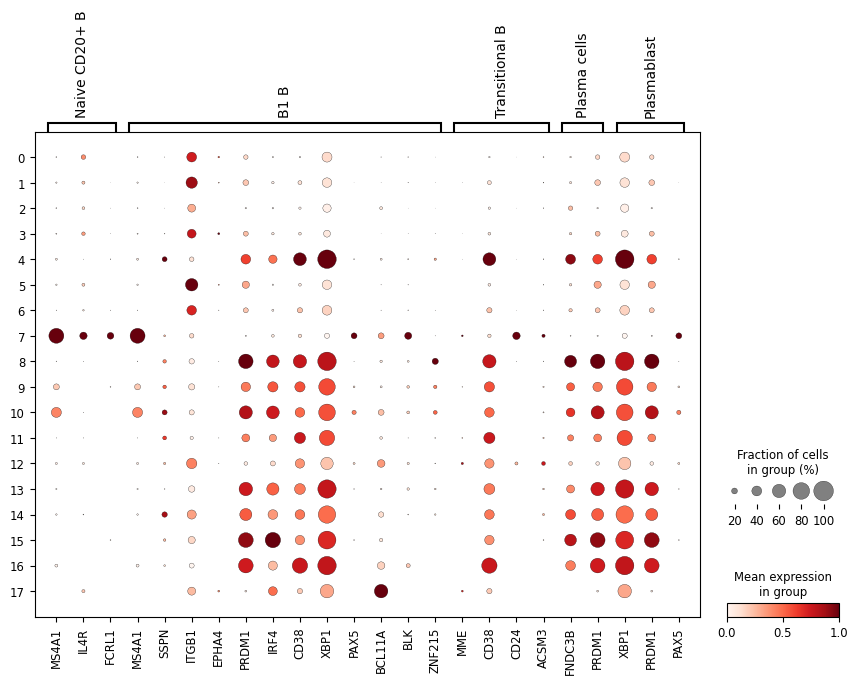

In [90]:
sc.pl.dotplot(
    adata_scvi,
    groupby="leiden",
    var_names=B_plasma_markers,
    standard_scale="var",# standard scale: normalize each gene to range from 0 to 1
)

In [144]:
cl_annotation = {"15": "plasma cells",
    "4": "plasma cells",
    "8": "plasma cells",
    "7": "Naive CD20+ B",
    "10": "B1 B",
    "9": "Plasma cells",
    "11": "Plasma cells",
    "13": "Plasma cells",
    "14": "Plasma cells",

}

In [145]:
adata_scvi.obs["manual_celltype_annotation"] = adata_scvi.obs.leiden.map(cl_annotation)

C:\Users\HP\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


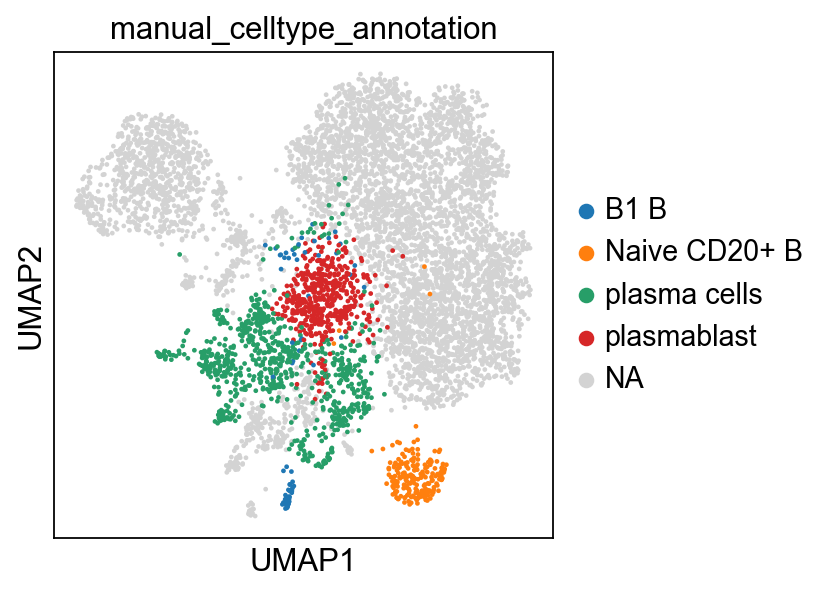

In [146]:
sc.pl.umap(adata_scvi, color=["manual_celltype_annotation"])

In [91]:
T_cells = ['CD4+ T activated',
 'CD4+ T naive',
 'CD8+ T',
 'T activation',
 'T naive']


In [92]:
T_cell_markers = {
    ct: [m for m in ct_markers if m in adata_scvi.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in T_cells
}

C:\Users\HP\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


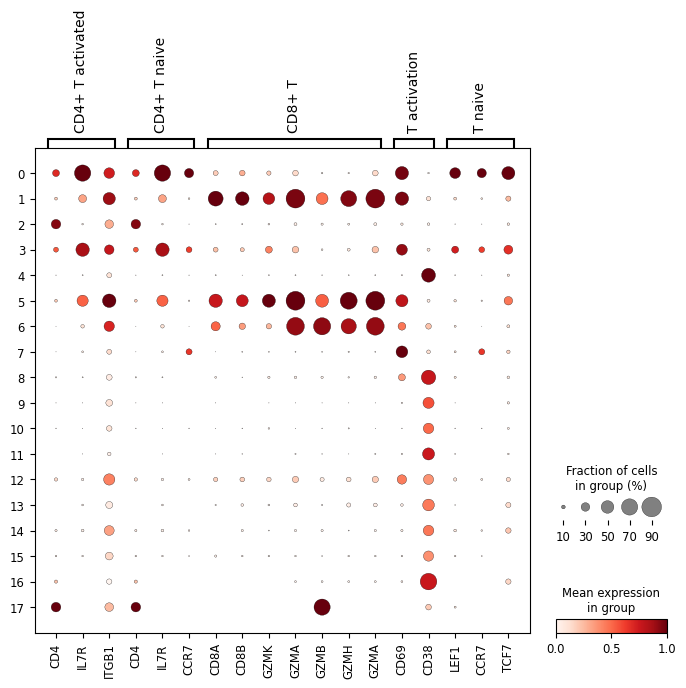

In [93]:
sc.pl.dotplot(
    adata_scvi,
    groupby="leiden",
    var_names=T_cell_markers,
    standard_scale="var",  # standard scale: normalize each gene to range from 0 to 1
)


In [97]:
cl_annotation2 = {
    "1": "CD8+ T",
    "5": "CD8+ T",
    "6": "CD8+ T",
    "0": "CD4+ T",
    "3": "CD4+ T",
}


In [98]:
adata_scvi.obs["manual_celltype_annotation2"] = adata_scvi.obs.leiden.map(cl_annotation2)

C:\Users\HP\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


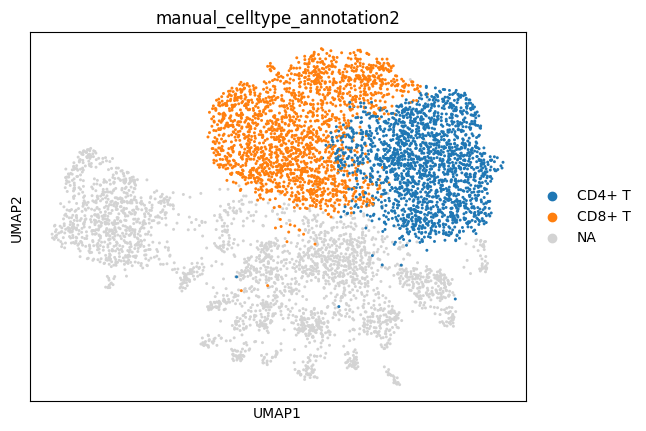

In [99]:
sc.pl.umap(adata_scvi, color=["manual_celltype_annotation2"])

In [100]:
Macrophages_ct = ['Macrophages']

In [101]:
Macropges_markers = {
    ct: [m for m in ct_markers if m in adata_scvi.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in Macrophages_ct
}

C:\Users\HP\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


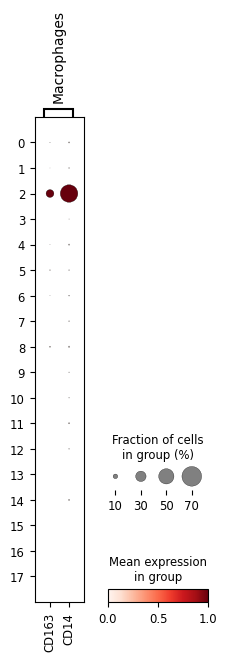

In [102]:
sc.pl.dotplot(
    adata_scvi,
    groupby="leiden",
    var_names=Macropges_markers,
    standard_scale="var",  # standard scale: normalize each gene to range from 0 to 1
)

In [103]:
cl_annotation3 = {
    "2": "Macrophages"

}

In [104]:
adata_scvi.obs["manual_celltype_annotation3"] = adata_scvi.obs.leiden.map(cl_annotation3)

C:\Users\HP\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


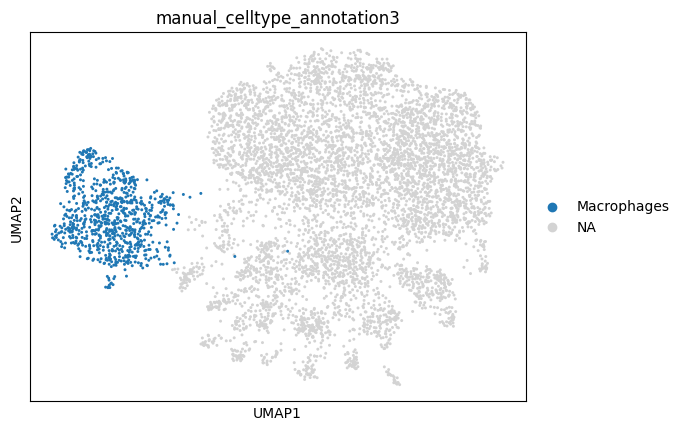

In [105]:
sc.pl.umap(adata_scvi, color=["manual_celltype_annotation3"])

In [106]:
NK_ct= ['NK', 'ILC','pDC']
NK_markers = {
    ct: [m for m in ct_markers if m in adata_scvi.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in NK_ct
}

C:\Users\HP\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


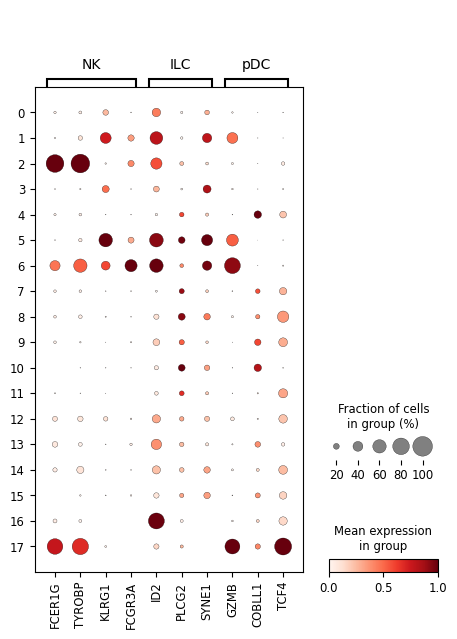

In [107]:
sc.pl.dotplot(
    adata_scvi,
    groupby="leiden",
    var_names=NK_markers,
    standard_scale="var",  # standard scale: normalize each gene to range from 0 to 1
)


In [108]:
cl_annotation4 = {
    "17": "NK", "16":"ILC"

}

In [109]:
adata_scvi.obs["manual_celltype_annotation4"] = adata_scvi.obs.leiden.map(cl_annotation4)

C:\Users\HP\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


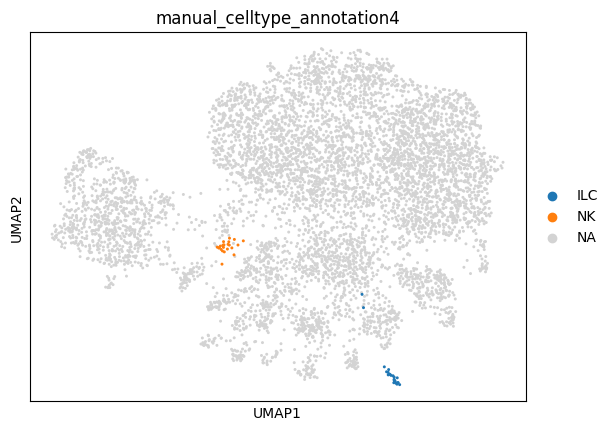

In [110]:
sc.pl.umap(adata_scvi, color=["manual_celltype_annotation4"])

In [114]:
Endothelial_ct = ['Endothelial']

In [121]:
Endothelial_markers = {
    ct: [m for m in ct_markers if m in adata_scvi.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in Endothelial_ct
}

C:\Users\HP\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


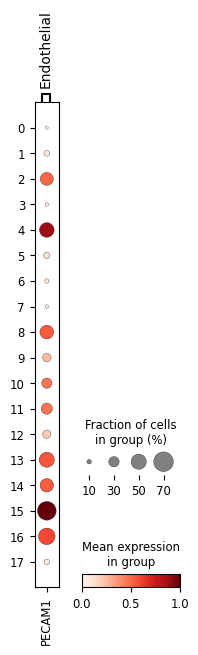

In [122]:
sc.pl.dotplot(
    adata_scvi,
    groupby="leiden",
    var_names=Endothelial_markers,
    standard_scale="var",  # standard scale: normalize each gene to range from 0 to 1
)

In [117]:
cl_annotation5= {"12": "endothelial"

}

In [118]:
adata_scvi.obs["manual_celltype_annotation5"] = adata_scvi.obs.leiden.map(cl_annotation5)

C:\Users\HP\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


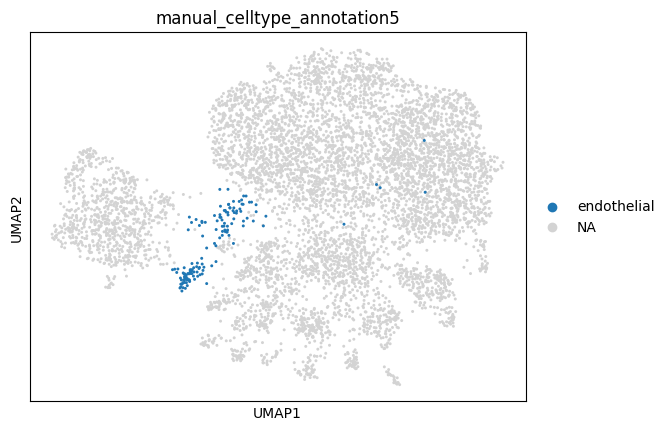

In [119]:
sc.pl.umap(adata_scvi, color=["manual_celltype_annotation5"])

In [ ]:
"15": "plasma cells",
    "4": "plasma cells",
    "8": "plasma cells",
    "7": "Naive CD20+ B",
    "10": "B1 B",
    "9": "Plasma cells",
    "11": "Plasma cells",
    "13": "Plasma cells",
    "14": "Plasma cells",
    "1": "CD8+ T",
    "5": "CD8+ T",
    "6": "CD8+ T",
    "0": "CD4+ T",
    "3": "CD4+ T",

In [123]:
cell_types= {"13": "plasma cells", 
    "6": "CD8+ T", "16": "ILC", "14":"plasma cells",
    "2": "Macrophages",
    "1": "CD8+ T",
    "5": "CD8+ T",
    "0": "CD4+ T",
    "3": "CD4+ T",
    "7": "Naive CD20+ B",
    "11": "plasma cells", 
    "4": "plasma cells",
    "8": "plasma cells",
    "9": "plasma cells",
    "15": "plasma cells",
    "12": "edothelial",
    "17": "NK",
    "10": "B1 B",
}

In [124]:
adata_scvi.obs["manual_cell_type"] = adata_scvi.obs.leiden.map(cell_types)

C:\Users\HP\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


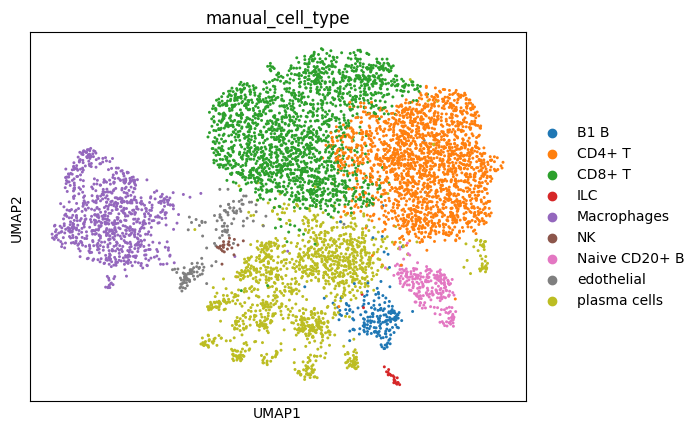

In [125]:
sc.pl.umap(adata_scvi, color=["manual_cell_type"])

### Automatic annotation

In [198]:
#!pip install celltypist

In [149]:
adata_scvi

AnnData object with n_obs × n_vars = 6602 × 3202
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'id', 'age', 'gender', 'stage', 'tissue', 'organism', 'treatment', 'study_id', 'sample_id', 'treatment_type', 'substage', 'subID', 'n_genes_by_counts', 'total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'n_genes', 'leiden', '_scvi_batch', '_scvi_labels'
    var: 'features', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'study_id_colors', '_scvi_uuid', '_scvi_manager_uuid'
    obsm: 'X_pca', 'X_umap', 'X_scVI'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

In [126]:
import celltypist
from celltypist import models

In [127]:
adata_celltypist = adata_scvi.copy()

In [128]:
models.download_models(
    force_update=True, model=["Immune_All_Low.pkl", "Immune_All_High.pkl"]
)

📜 Retrieving model list from server https://celltypist.cog.sanger.ac.uk/models/models.json
📚 Total models in list: 44
📂 Storing models in C:\Users\HP\.celltypist\data\models
💾 Total models to download: 2
💾 Downloading model [1/2]: Immune_All_Low.pkl
💾 Downloading model [2/2]: Immune_All_High.pkl


In [129]:
model_low = models.Model.load(model="Immune_All_Low.pkl")
model_high = models.Model.load(model="Immune_All_High.pkl")

In [130]:
model_high.cell_types


array(['B cells', 'B-cell lineage', 'Cycling cells', 'DC', 'DC precursor',
       'Double-negative thymocytes', 'Double-positive thymocytes', 'ETP',
       'Early MK', 'Endothelial cells', 'Epithelial cells',
       'Erythrocytes', 'Erythroid', 'Fibroblasts', 'Granulocytes',
       'HSC/MPP', 'ILC', 'ILC precursor', 'MNP', 'Macrophages',
       'Mast cells', 'Megakaryocyte precursor',
       'Megakaryocytes/platelets', 'Mono-mac', 'Monocyte precursor',
       'Monocytes', 'Myelocytes', 'Plasma cells', 'Promyelocytes',
       'T cells', 'pDC', 'pDC precursor'], dtype=object)

In [131]:
model_low.cell_types

array(['Age-associated B cells', 'Alveolar macrophages', 'B cells',
       'CD16+ NK cells', 'CD16- NK cells', 'CD8a/a', 'CD8a/b(entry)',
       'CMP', 'CRTAM+ gamma-delta T cells', 'Classical monocytes',
       'Cycling B cells', 'Cycling DCs', 'Cycling NK cells',
       'Cycling T cells', 'Cycling gamma-delta T cells',
       'Cycling monocytes', 'DC', 'DC precursor', 'DC1', 'DC2', 'DC3',
       'Double-negative thymocytes', 'Double-positive thymocytes', 'ELP',
       'ETP', 'Early MK', 'Early erythroid', 'Early lymphoid/T lymphoid',
       'Endothelial cells', 'Epithelial cells', 'Erythrocytes',
       'Erythrophagocytic macrophages', 'Fibroblasts',
       'Follicular B cells', 'Follicular helper T cells', 'GMP',
       'Germinal center B cells', 'Granulocytes', 'HSC/MPP',
       'Hofbauer cells', 'ILC', 'ILC precursor', 'ILC1', 'ILC2', 'ILC3',
       'Intermediate macrophages', 'Intestinal macrophages',
       'Kidney-resident macrophages', 'Kupffer cells',
       'Large pre-B cell

In [132]:
predictions_high = celltypist.annotate(
    adata_celltypist, model=model_high, majority_voting=True
)

👀 Invalid expression matrix in `.X`, expect log1p normalized expression to 10000 counts per cell; will try the `.raw` attribute
🔬 Input data has 6602 cells and 14639 genes
🔗 Matching reference genes in the model
🧬 4910 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 10


running Leiden clustering
    finished: found 138 clusters and added
    'over_clustering', the cluster labels (adata.obs, categorical) (0:00:02)


🗳️ Majority voting the predictions
✅ Majority voting done!


In [133]:
predictions_high_adata = predictions_high.to_adata()

In [134]:
adata_scvi.obs["celltypist_cell_label_coarse"] = predictions_high_adata.obs.loc[
    adata_scvi.obs.index, "majority_voting"
]
adata_scvi.obs["celltypist_conf_score_coarse"] = predictions_high_adata.obs.loc[
    adata_scvi.obs.index, "conf_score"
]

In [135]:
predictions_low = celltypist.annotate(
    adata_celltypist, model=model_low, majority_voting=True
)

👀 Invalid expression matrix in `.X`, expect log1p normalized expression to 10000 counts per cell; will try the `.raw` attribute
🔬 Input data has 6602 cells and 14639 genes
🔗 Matching reference genes in the model
🧬 4910 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 10


running Leiden clustering
    finished: found 138 clusters and added
    'over_clustering', the cluster labels (adata.obs, categorical) (0:00:02)


🗳️ Majority voting the predictions
✅ Majority voting done!


In [136]:
predictions_low_adata = predictions_low.to_adata()

In [137]:
adata_scvi.obs["celltypist_cell_label_fine"] = predictions_low_adata.obs.loc[
    adata_scvi.obs.index, "majority_voting"
]
adata_scvi.obs["celltypist_conf_score_fine"] = predictions_low_adata.obs.loc[
    adata_scvi.obs.index, "conf_score"
]

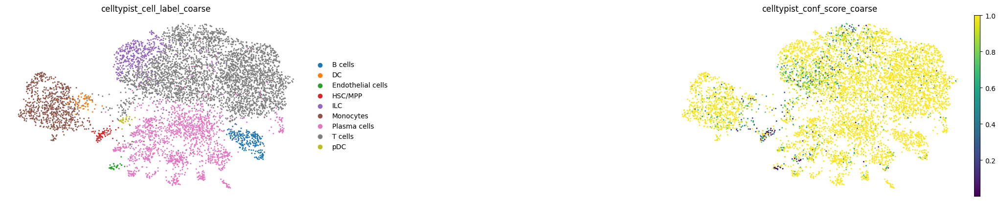

In [138]:
sc.pl.umap(
    adata_scvi,
    color=["celltypist_cell_label_coarse", "celltypist_conf_score_coarse"],
    frameon=False,
    sort_order=False,
    wspace=1,
)

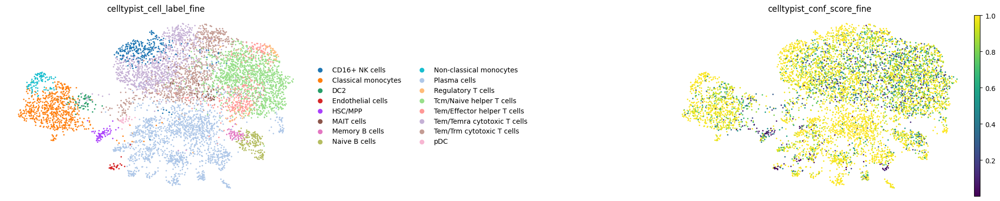

In [139]:
sc.pl.umap(
    adata_scvi,
    color=["celltypist_cell_label_fine", "celltypist_conf_score_fine"],
    frameon=False,
    sort_order=False,
    wspace=1,
)

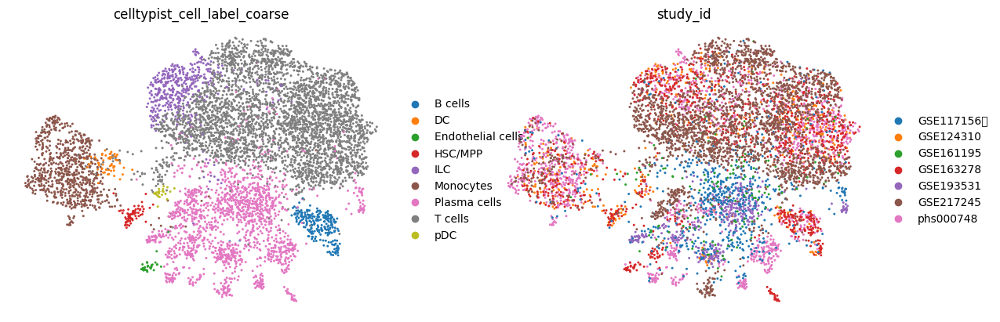

In [140]:
sc.pl.umap(adata_scvi, color = ['celltypist_cell_label_coarse', 'study_id'], frameon = False)


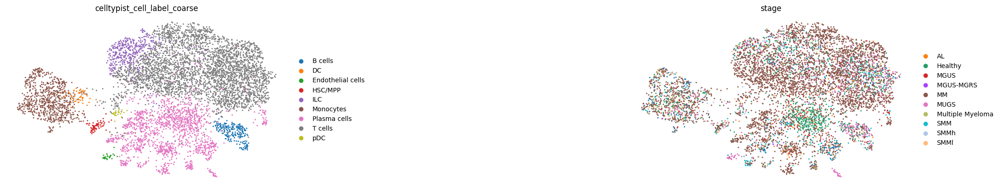

In [141]:
sc.pl.umap(
    adata_scvi,
    color=["celltypist_cell_label_coarse", "stage"],
    frameon=False,
    sort_order=False,
    wspace=1,
)

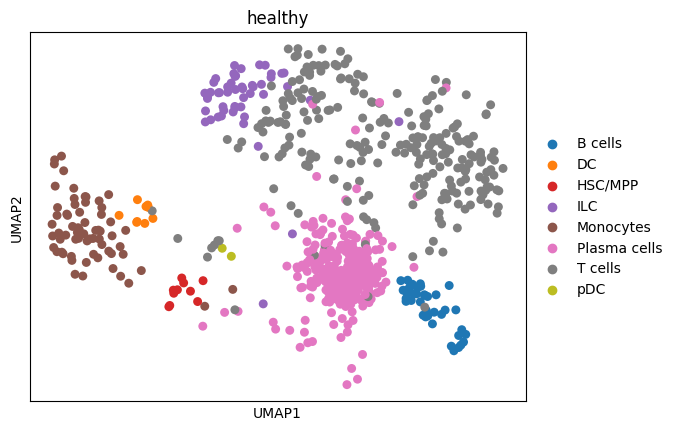

Healthy





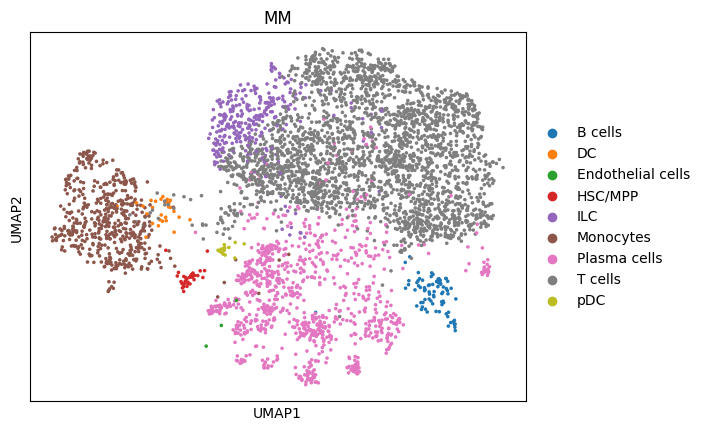

MM stage





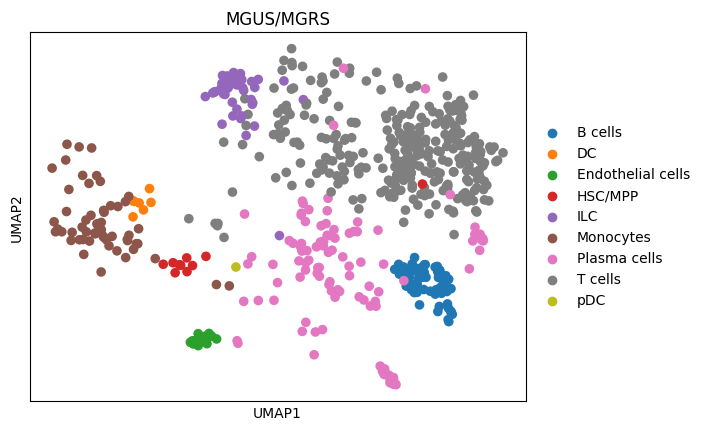

MGUS stage





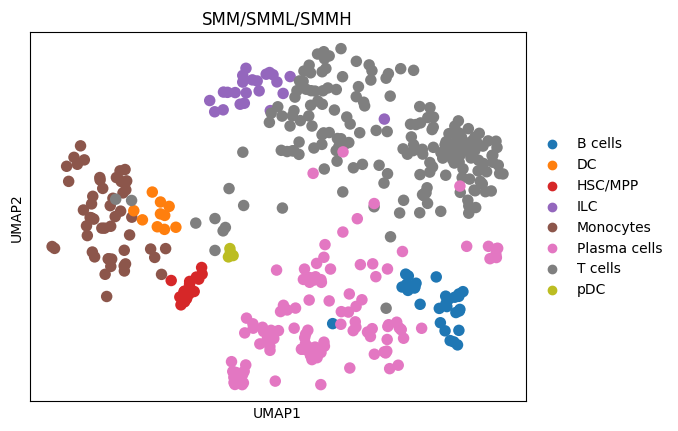

SMM, SMML, SMMH stage





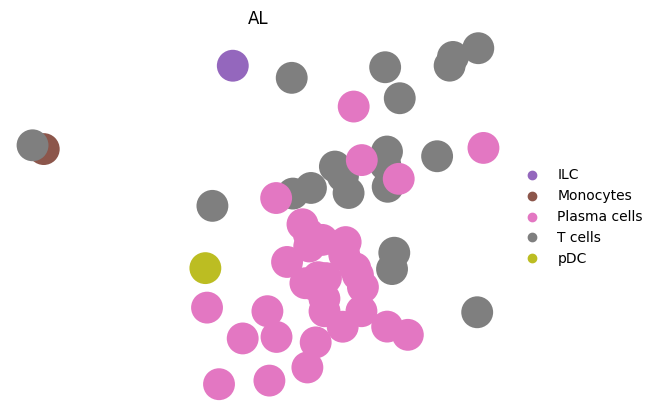

AL stage





In [142]:
sc.pl.umap(adata_scvi[adata_scvi.obs['stage']=="Healthy"], color = ['celltypist_cell_label_coarse'], frameon = True, vmax = 5, title="healthy")
print("Healthy\n\n\n")

sc.pl.umap(adata_scvi[(adata_scvi.obs['stage']=="MM") | (adata_scvi.obs['stage']=="Multiple Myeloma")], color = ['celltypist_cell_label_coarse'], frameon = True, vmax = 5, title="MM")
print("MM stage\n\n\n")

sc.pl.umap(adata_scvi[(adata_scvi.obs['stage']=="MUGS") | (adata_scvi.obs['stage']=="MGUS") | (adata_scvi.obs['stage']=="MGUS-MGRS")], color = ['celltypist_cell_label_coarse'], frameon = True, vmax = 5, title="MGUS/MGRS")
print("MGUS stage\n\n\n")

sc.pl.umap(adata_scvi[(adata_scvi.obs['stage']=="SMM") | (adata_scvi.obs['stage']=="SMMh") | (adata_scvi.obs['stage']=="SMMl")], color = ['celltypist_cell_label_coarse'], frameon = True, vmax = 5, title="SMM/SMML/SMMH")
print("SMM, SMML, SMMH stage\n\n\n")

sc.pl.umap(adata_scvi[(adata_scvi.obs['stage']=="AL")], color = ['celltypist_cell_label_coarse'], frameon = False, vmax = 5, title="AL")
print("AL stage\n\n\n")

In [143]:
adata_scvi.var

,features,mt,ribo,hb,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts,n_cells,highly_variable,means,dispersions,dispersions_norm,mean,std
FUCA2,FUCA2,False,False,False,630,0.103475,92.011159,816.0,580,True,0.432600,2.721236,1.158503,-2.152508e-18,0.508555
LAS1L,LAS1L,False,False,False,473,0.069744,94.002029,550.0,432,True,0.304472,2.688549,1.026439,5.058393e-17,0.432189
CASP10,CASP10,False,False,False,619,0.104996,92.150647,828.0,576,True,0.490886,2.851124,1.683283,2.152508e-17,0.543276
TFPI,TFPI,False,False,False,42,0.007989,99.467411,63.0,40,True,0.058033,3.870995,3.280823,3.228761e-18,0.155066
CD38,CD38,False,False,False,1362,0.343013,82.728887,2705.0,1245,True,1.080684,3.133396,2.530075,1.291505e-16,0.846655
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
C11orf98,C11orf98,False,False,False,194,0.030307,97.539944,239.0,176,True,0.183443,3.093597,1.634064,2.152508e-18,0.316240
C2orf81,C2orf81,False,False,False,38,0.005580,99.518133,44.0,37,True,0.038832,2.613831,0.617776,1.345317e-18,0.145658
CCDC39,CCDC39,False,False,False,49,0.008496,99.378646,67.0,47,True,0.052755,3.069659,1.583356,-2.085242e-18,0.159650
PRRC2B,PRRC2B,False,False,False,172,0.027137,97.818920,214.0,152,True,0.192201,2.987696,1.409734,-6.457523e-18,0.320187


## Saving the object as h5ad to Disk and extract data for cell chat 



In [182]:
adata_scvi.__dict__['_raw'].__dict__['_var'] = adata_scvi.__dict__['_raw'].__dict__['_var'].rename(columns={'_index': 'features'})
 
#2, deleting the backed up raw information
del adata_scvi.raw

In [144]:
adata_scvi.write('MM_adata_auto_annot_final.h5ad',  compression="gzip")

In [145]:
adata_scvi

AnnData object with n_obs × n_vars = 6602 × 2974
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'id', 'age', 'gender', 'stage', 'tissue', 'organism', 'treatment', 'study_id', 'sample_id', 'treatment_type', 'substage', 'subID', 'n_genes_by_counts', 'total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'n_genes', 'leiden', '_scvi_batch', '_scvi_labels', 'manual_celltype_annotation2', 'manual_celltype_annotation3', 'manual_celltype_annotation4', 'manual_celltype_annotation5', 'manual_cell_type', 'celltypist_cell_label_coarse', 'celltypist_conf_score_coarse', 'celltypist_cell_label_fine', 'celltypist_conf_score_fine'
    var: 'features', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 

In [149]:
#t=adata2.X.to_array()

In [148]:
#t=adata_raw.X.toarray()
pd.DataFrame(data=adata2.X, index=adata_scvi.obs_names, columns=adata_scvi.var_names).to_csv('hvg_logNormcounts.csv')
# comma separated csv with header, no rownames
pd.DataFrame(adata_scvi.obs).to_csv("metadata.csv")

### Cell Abundance part1

In [4]:
adata_scvi = sc.read("MM_adata_auto_annot_final.h5ad")
adata_scvi


AnnData object with n_obs × n_vars = 6602 × 2974
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'id', 'age', 'gender', 'stage', 'tissue', 'organism', 'treatment', 'study_id', 'sample_id', 'treatment_type', 'substage', 'subID', 'n_genes_by_counts', 'total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'n_genes', 'leiden', '_scvi_batch', '_scvi_labels', 'manual_celltype_annotation2', 'manual_celltype_annotation3', 'manual_celltype_annotation4', 'manual_celltype_annotation5', 'manual_cell_type', 'celltypist_cell_label_coarse', 'celltypist_conf_score_coarse', 'celltypist_cell_label_fine', 'celltypist_conf_score_fine'
    var: 'features', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'celltypist_cell_l

In [5]:
ref_data = sc.read("MM_model_data_processed.h5ad")
ref_data

AnnData object with n_obs × n_vars = 64781 × 16754
    obs: 'Dataset', 'donor_id', 'development_stage', 'sex', 'suspension_type', 'assay', 'Original_annotation', 'CellHint_harmonised_group', 'cell_type', 'Curated_annotation', 'organism', 'disease', 'tissue', 'n_genes_by_counts', 'total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'n_genes'
    var: 'exist_in_Tabula2022', 'exist_in_DominguezConde2022', 'exist_in_Roy2021', 'exist_in_He2020', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'log1p', 'schema_version', 'title'
    obsm: 'X_umap'
    layers: 'counts'

In [ ]:
ref_data2 = adata2[:, adata2.var.highly_variable] #filter highly variable
ref_data2

In [151]:
adata_scvi.obs.stage.unique().tolist()

['MGUS',
 'SMMl',
 'SMMh',
 'MM',
 'Healthy',
 '',
 'Multiple Myeloma',
 'SMM',
 'MUGS',
 'AL',
 'MGUS-MGRS ']

In [152]:
adata_sub = adata_scvi[adata_scvi.obs.stage!=""]

In [153]:
cell_type_counts = adata_sub.obs.groupby(['stage', 'celltypist_cell_label_fine']).count()
cell_type_counts = cell_type_counts[cell_type_counts.sum(axis = 1) > 0].reset_index()
#cell_type_counts = cell_type_counts[(cell_type_counts.stage=="MM")| (cell_type_counts.stage=="Healthy")]
cell_type_counts

,stage,celltypist_cell_label_fine,orig.ident,nCount_RNA,nFeature_RNA,id,age,gender,tissue,organism,...,_scvi_batch,_scvi_labels,manual_celltype_annotation2,manual_celltype_annotation3,manual_celltype_annotation4,manual_celltype_annotation5,manual_cell_type,celltypist_cell_label_coarse,celltypist_conf_score_coarse,celltypist_conf_score_fine
0,AL,CD16+ NK cells,1,1,1,1,1,1,1,1,...,1,1,1,0,0,0,1,1,1,1
1,AL,Non-classical monocytes,1,1,1,1,1,1,1,1,...,1,1,0,1,0,0,1,1,1,1
2,AL,Plasma cells,34,34,34,34,34,34,34,34,...,34,34,3,0,0,0,34,34,34,34
3,AL,Regulatory T cells,2,2,2,2,2,2,2,2,...,2,2,2,0,0,0,2,2,2,2
4,AL,Tcm/Naive helper T cells,4,4,4,4,4,4,4,4,...,4,4,3,1,0,0,4,4,4,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
116,SMMl,Non-classical monocytes,1,1,1,1,1,1,1,1,...,1,1,0,1,0,0,1,1,1,1
117,SMMl,Plasma cells,20,20,20,20,20,20,20,20,...,20,20,0,0,0,0,20,20,20,20
118,SMMl,Tcm/Naive helper T cells,15,15,15,15,15,15,15,15,...,15,15,15,0,0,0,15,15,15,15
119,SMMl,Tem/Temra cytotoxic T cells,7,7,7,7,7,7,7,7,...,7,7,7,0,0,0,7,7,7,7


In [154]:
num_tot_cells = adata_sub.obs.groupby(['stage']).count()
num_tot_cells = dict(zip(num_tot_cells.index, num_tot_cells.nCount_RNA))
num_tot_cells

{'AL': 57,
 'Healthy': 725,
 'MGUS': 185,
 'MGUS-MGRS ': 10,
 'MM': 4253,
 'MUGS': 438,
 'Multiple Myeloma': 211,
 'SMM': 242,
 'SMMh': 130,
 'SMMl': 68}

In [155]:
cell_type_counts['total_cells'] = cell_type_counts.stage.map(num_tot_cells).astype(int)

cell_type_counts['frequency'] = cell_type_counts.nCount_RNA / cell_type_counts.total_cells

cell_type_counts

,stage,celltypist_cell_label_fine,orig.ident,nCount_RNA,nFeature_RNA,id,age,gender,tissue,organism,...,manual_celltype_annotation2,manual_celltype_annotation3,manual_celltype_annotation4,manual_celltype_annotation5,manual_cell_type,celltypist_cell_label_coarse,celltypist_conf_score_coarse,celltypist_conf_score_fine,total_cells,frequency
0,AL,CD16+ NK cells,1,1,1,1,1,1,1,1,...,1,0,0,0,1,1,1,1,57,0.017544
1,AL,Non-classical monocytes,1,1,1,1,1,1,1,1,...,0,1,0,0,1,1,1,1,57,0.017544
2,AL,Plasma cells,34,34,34,34,34,34,34,34,...,3,0,0,0,34,34,34,34,57,0.596491
3,AL,Regulatory T cells,2,2,2,2,2,2,2,2,...,2,0,0,0,2,2,2,2,57,0.035088
4,AL,Tcm/Naive helper T cells,4,4,4,4,4,4,4,4,...,3,1,0,0,4,4,4,4,57,0.070175
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
116,SMMl,Non-classical monocytes,1,1,1,1,1,1,1,1,...,0,1,0,0,1,1,1,1,68,0.014706
117,SMMl,Plasma cells,20,20,20,20,20,20,20,20,...,0,0,0,0,20,20,20,20,68,0.294118
118,SMMl,Tcm/Naive helper T cells,15,15,15,15,15,15,15,15,...,15,0,0,0,15,15,15,15,68,0.220588
119,SMMl,Tem/Temra cytotoxic T cells,7,7,7,7,7,7,7,7,...,7,0,0,0,7,7,7,7,68,0.102941


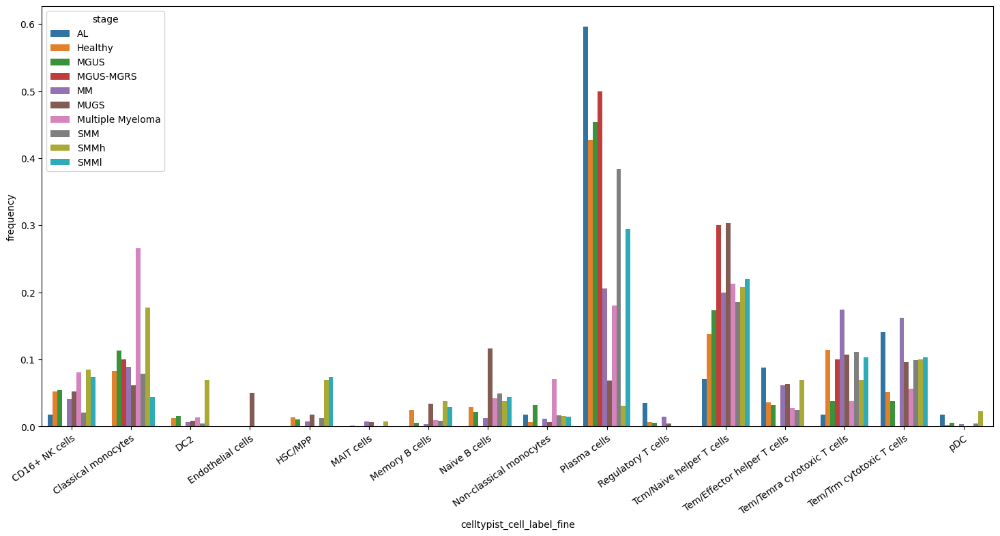

In [156]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize = (18,8))

ax = sns.barplot(data = cell_type_counts, x = 'celltypist_cell_label_fine', y = 'frequency', hue = 'stage')

plt.xticks(rotation = 35, rotation_mode = 'anchor', ha = 'right')

plt.show()


In [157]:
adata_sub = adata_scvi[(adata_scvi.obs.stage=="MM") |(adata_scvi.obs.stage=="Healthy")]

In [158]:
cell_type_counts = adata_sub.obs.groupby(['stage', 'celltypist_cell_label_fine']).count()
cell_type_counts = cell_type_counts[cell_type_counts.sum(axis = 1) > 0].reset_index()
#cell_type_counts = cell_type_counts[(cell_type_counts.stage=="MM")| (cell_type_counts.stage=="Healthy")]
cell_type_counts

,stage,celltypist_cell_label_fine,orig.ident,nCount_RNA,nFeature_RNA,id,age,gender,tissue,organism,...,_scvi_batch,_scvi_labels,manual_celltype_annotation2,manual_celltype_annotation3,manual_celltype_annotation4,manual_celltype_annotation5,manual_cell_type,celltypist_cell_label_coarse,celltypist_conf_score_coarse,celltypist_conf_score_fine
0,Healthy,CD16+ NK cells,38,38,38,38,38,38,38,38,...,38,38,38,0,0,0,38,38,38,38
1,Healthy,Classical monocytes,60,60,60,60,60,60,60,60,...,60,60,0,58,0,0,60,60,60,60
2,Healthy,DC2,9,9,9,9,9,9,9,9,...,9,9,0,9,0,0,9,9,9,9
3,Healthy,HSC/MPP,10,10,10,10,10,10,10,10,...,10,10,0,0,0,10,10,10,10,10
4,Healthy,MAIT cells,1,1,1,1,1,1,1,1,...,1,1,1,0,0,0,1,1,1,1
5,Healthy,Memory B cells,18,18,18,18,18,18,18,18,...,18,18,0,0,0,0,18,18,18,18
6,Healthy,Naive B cells,21,21,21,21,21,21,21,21,...,21,21,0,0,0,0,21,21,21,21
7,Healthy,Non-classical monocytes,5,5,5,5,5,5,5,5,...,5,5,0,5,0,0,5,5,5,5
8,Healthy,Plasma cells,310,310,310,310,310,310,310,310,...,310,310,16,0,0,1,310,310,310,310
9,Healthy,Regulatory T cells,5,5,5,5,5,5,5,5,...,5,5,5,0,0,0,5,5,5,5


In [159]:
num_tot_cells = adata_sub.obs.groupby(['stage']).count()
num_tot_cells = dict(zip(num_tot_cells.index, num_tot_cells.nCount_RNA))
num_tot_cells

{'Healthy': 725, 'MM': 4253}

In [160]:
cell_type_counts['total_cells'] = cell_type_counts.stage.map(num_tot_cells).astype(int)

cell_type_counts['frequency'] = cell_type_counts.nCount_RNA / cell_type_counts.total_cells

cell_type_counts

,stage,celltypist_cell_label_fine,orig.ident,nCount_RNA,nFeature_RNA,id,age,gender,tissue,organism,...,manual_celltype_annotation2,manual_celltype_annotation3,manual_celltype_annotation4,manual_celltype_annotation5,manual_cell_type,celltypist_cell_label_coarse,celltypist_conf_score_coarse,celltypist_conf_score_fine,total_cells,frequency
0,Healthy,CD16+ NK cells,38,38,38,38,38,38,38,38,...,38,0,0,0,38,38,38,38,725,0.052414
1,Healthy,Classical monocytes,60,60,60,60,60,60,60,60,...,0,58,0,0,60,60,60,60,725,0.082759
2,Healthy,DC2,9,9,9,9,9,9,9,9,...,0,9,0,0,9,9,9,9,725,0.012414
3,Healthy,HSC/MPP,10,10,10,10,10,10,10,10,...,0,0,0,10,10,10,10,10,725,0.013793
4,Healthy,MAIT cells,1,1,1,1,1,1,1,1,...,1,0,0,0,1,1,1,1,725,0.001379
5,Healthy,Memory B cells,18,18,18,18,18,18,18,18,...,0,0,0,0,18,18,18,18,725,0.024828
6,Healthy,Naive B cells,21,21,21,21,21,21,21,21,...,0,0,0,0,21,21,21,21,725,0.028966
7,Healthy,Non-classical monocytes,5,5,5,5,5,5,5,5,...,0,5,0,0,5,5,5,5,725,0.006897
8,Healthy,Plasma cells,310,310,310,310,310,310,310,310,...,16,0,0,1,310,310,310,310,725,0.427586
9,Healthy,Regulatory T cells,5,5,5,5,5,5,5,5,...,5,0,0,0,5,5,5,5,725,0.006897


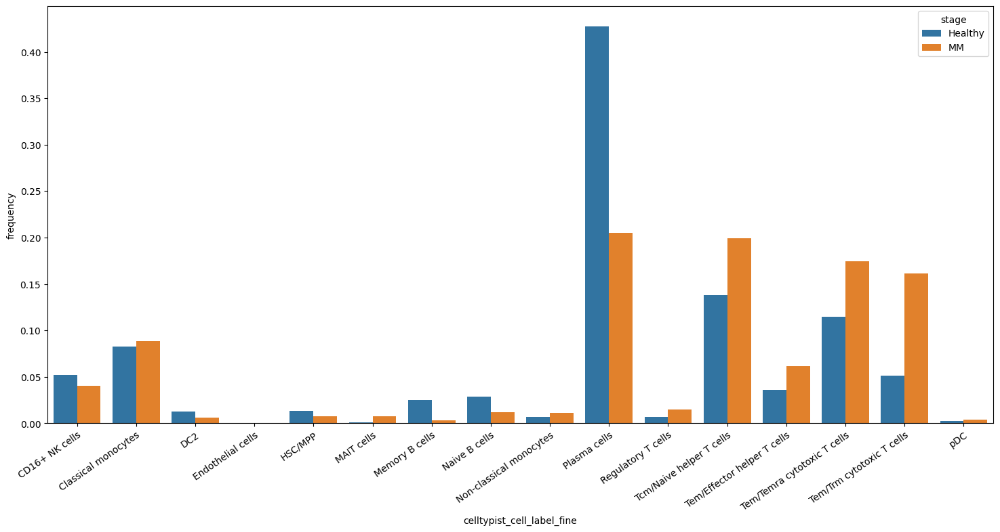

In [161]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize = (18,8))

ax = sns.barplot(data = cell_type_counts, x = 'celltypist_cell_label_fine', y = 'frequency', hue = 'stage')

plt.xticks(rotation = 35, rotation_mode = 'anchor', ha = 'right')

plt.show()


### Biomarker indentificcation between MM and Healthy

#### Select MM and Healthy stages only from the adata

In [ ]:
#adata_sub = adata_scvi[adata_scvi.obs.stage!=""]
#adata_sub = adata_scvi[(adata_scvi.obs.stage=="MM") |(adata_scvi.obs.stage=="Healthy")]

#### Selection of T cells, NK and Plasma cells

In [162]:
Tcells1 = adata_sub[adata_sub.obs['celltypist_cell_label_fine'] == 'Tem/Effector helper T cells'].copy()
Tcells2 = adata_sub[adata_sub.obs['celltypist_cell_label_fine'] == 'Tem/Temra cytotoxic T cells'].copy()
Tcells3 = adata_sub[adata_sub.obs['celltypist_cell_label_fine'] == 'Tcm/Naive helper T cells'].copy()
Tcells4 = adata_sub[adata_sub.obs['celltypist_cell_label_fine'] == 'Tem/Trm cytotoxic T cells'].copy()
NK16cells = adata_sub[adata_sub.obs['celltypist_cell_label_fine'] == 'CD16+ NK cells'].copy()
Plasmacells = adata_sub[adata_sub.obs['celltypist_cell_label_fine'] == 'Plasma cells'].copy()

In [163]:
cells = [Tcells1, Tcells2, Tcells3, Tcells4, NK16cells, Plasmacells]
for cell in cells:
    print(cell.X.shape)
    print(cell.obs.stage.value_counts())

(289, 2974)
stage
MM         263
Healthy     26
Name: count, dtype: int64
(824, 2974)
stage
MM         741
Healthy     83
Name: count, dtype: int64
(949, 2974)
stage
MM         849
Healthy    100
Name: count, dtype: int64
(725, 2974)
stage
MM         688
Healthy     37
Name: count, dtype: int64
(211, 2974)
stage
MM         173
Healthy     38
Name: count, dtype: int64
(1184, 2974)
stage
MM         874
Healthy    310
Name: count, dtype: int64


#### Model Training, evaluation and selection

Tem/effector H
RandomForestClassifier
accuracy 0.91
f1 score 0.95
ROC AUC 0.64
PR AUC 0.91
[0.91]


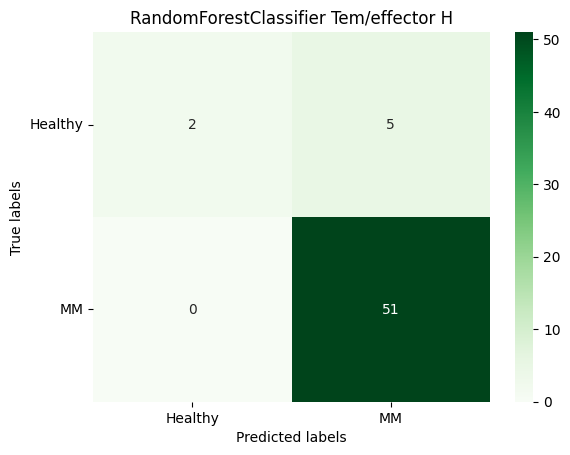

Tem/temra
RandomForestClassifier
accuracy 0.93
f1 score 0.96
ROC AUC 0.68
PR AUC 0.93
[0.91, 0.93]


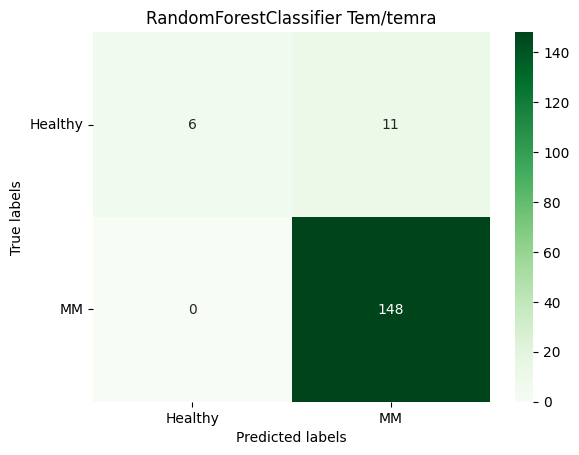

Tcm/naive
RandomForestClassifier
accuracy 0.93
f1 score 0.96
ROC AUC 0.65
PR AUC 0.92
[0.91, 0.93, 0.92]


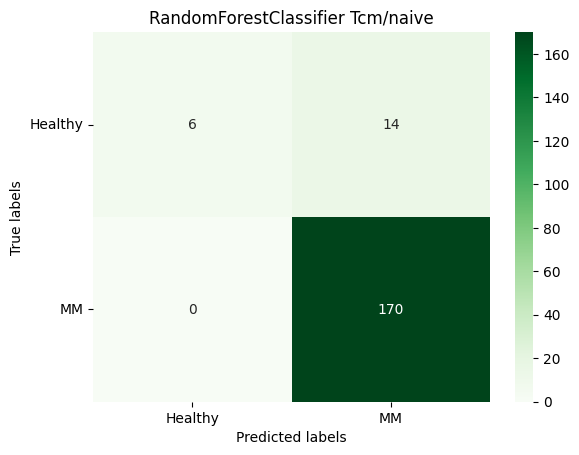

Tem/Trm
RandomForestClassifier
accuracy 0.95
f1 score 0.98
ROC AUC 0.56
PR AUC 0.95
[0.91, 0.93, 0.92, 0.95]


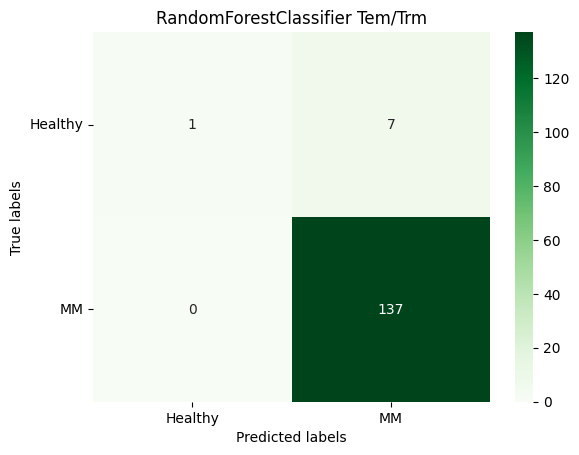

NK16cells
RandomForestClassifier
accuracy 0.86
f1 score 0.92
ROC AUC 0.63
PR AUC 0.87
[0.91, 0.93, 0.92, 0.95, 0.87]


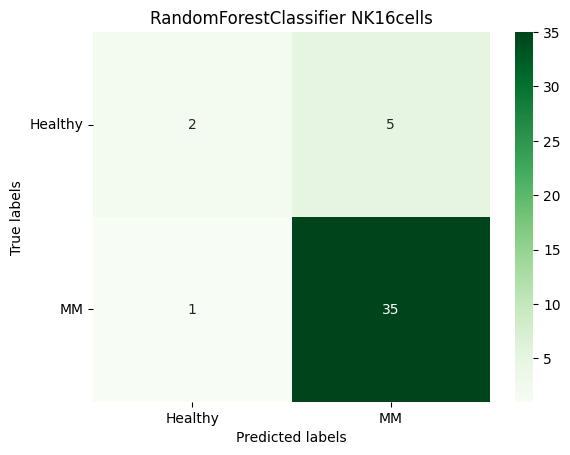

Plasmacells
RandomForestClassifier
accuracy 0.89
f1 score 0.93
ROC AUC 0.78
PR AUC 0.88
[0.91, 0.93, 0.92, 0.95, 0.87, 0.88]


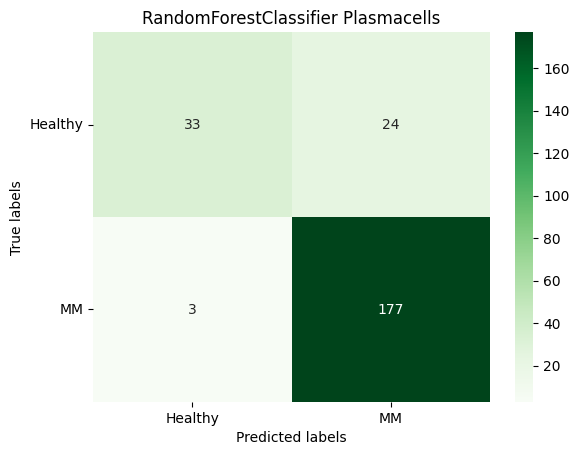

Tem/effector H
LogisticRegression
accuracy 0.88
f1 score 0.93
ROC AUC 0.56
PR AUC 0.89
[0.89]


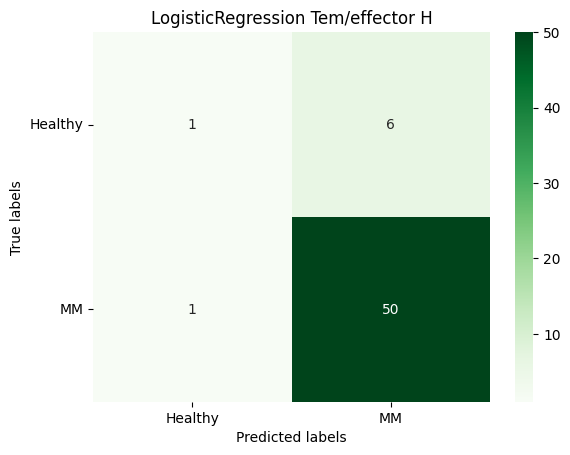

Tem/temra
LogisticRegression
accuracy 0.93
f1 score 0.96
ROC AUC 0.83
PR AUC 0.96
[0.89, 0.96]


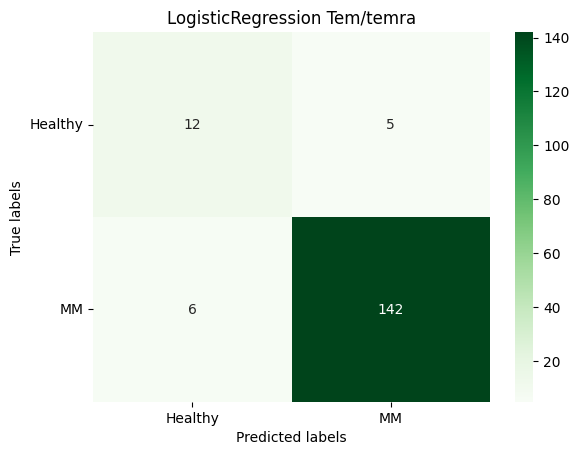

Tcm/naive
LogisticRegression
accuracy 0.88
f1 score 0.93
ROC AUC 0.71
PR AUC 0.94
[0.89, 0.96, 0.94]


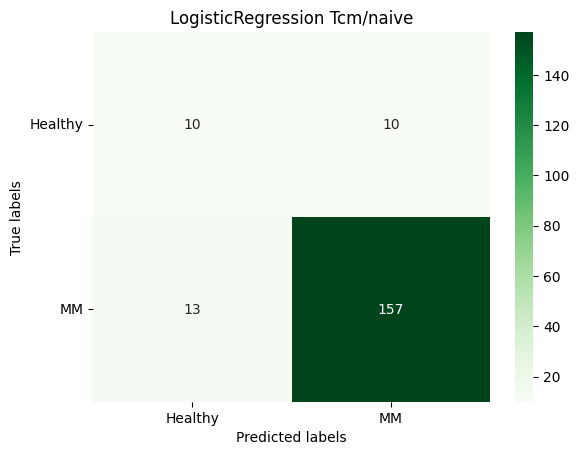

Tem/Trm
LogisticRegression
accuracy 0.89
f1 score 0.94
ROC AUC 0.71
PR AUC 0.97
[0.89, 0.96, 0.94, 0.97]


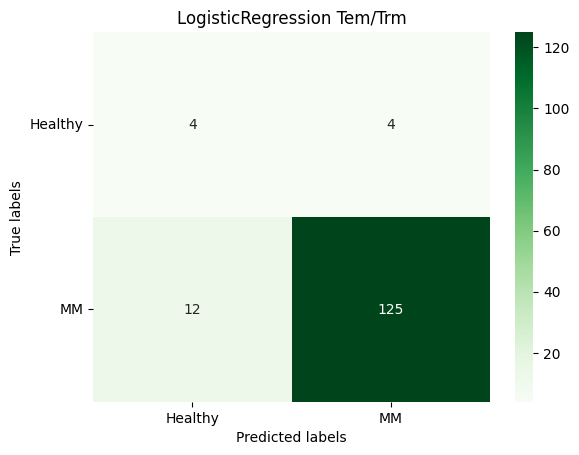

NK16cells
LogisticRegression
accuracy 0.79
f1 score 0.87
ROC AUC 0.7
PR AUC 0.9
[0.89, 0.96, 0.94, 0.97, 0.9]


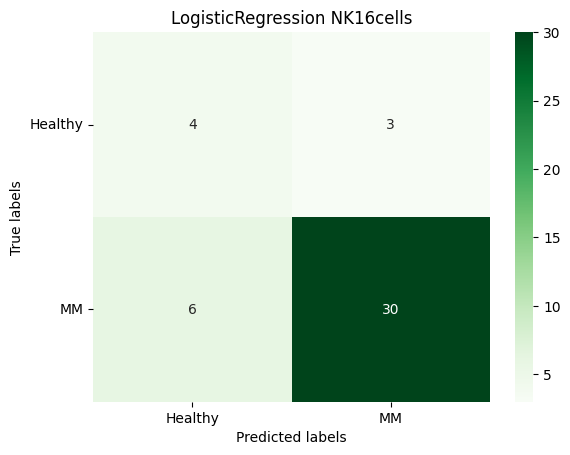

Plasmacells
LogisticRegression
accuracy 0.9
f1 score 0.93
ROC AUC 0.9
PR AUC 0.95
[0.89, 0.96, 0.94, 0.97, 0.9, 0.95]


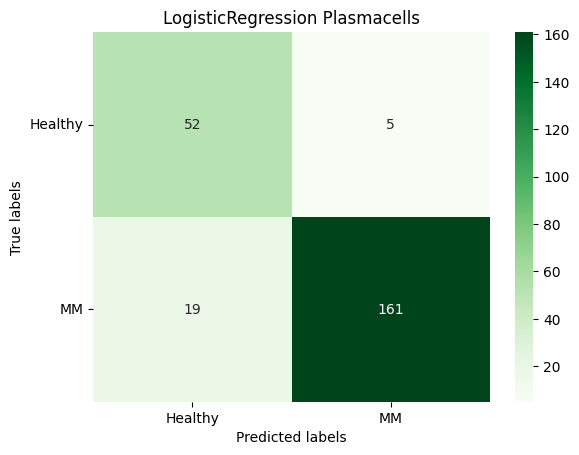

Tem/effector H
KNeighborsClassifier
accuracy 0.88
f1 score 0.94
ROC AUC 0.5
PR AUC 0.88
[0.88]


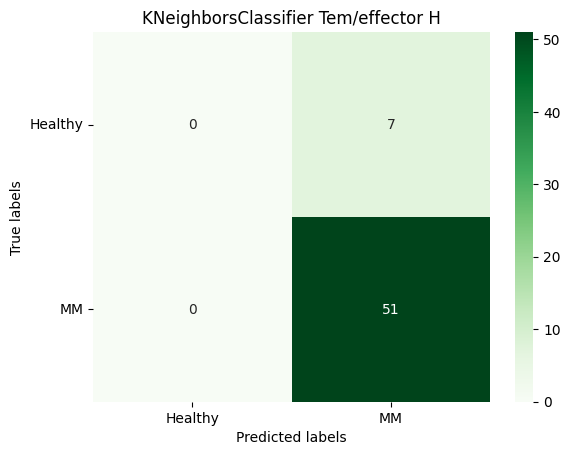

Tem/temra
KNeighborsClassifier
accuracy 0.9
f1 score 0.95
ROC AUC 0.5
PR AUC 0.9
[0.88, 0.9]


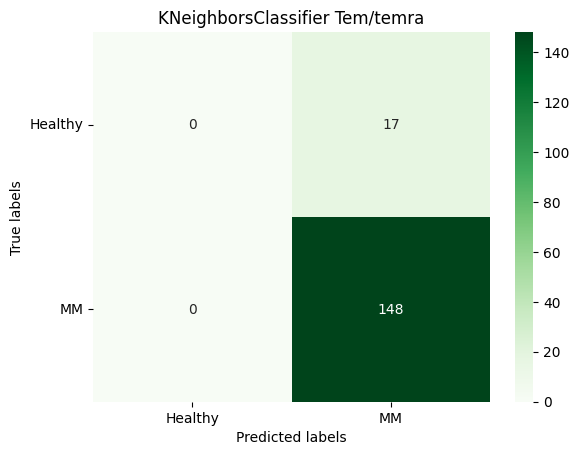

Tcm/naive
KNeighborsClassifier
accuracy 0.89
f1 score 0.94
ROC AUC 0.5
PR AUC 0.89
[0.88, 0.9, 0.89]


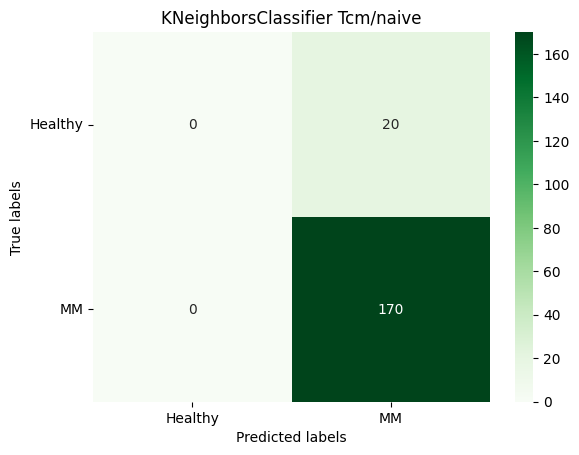

Tem/Trm
KNeighborsClassifier
accuracy 0.94
f1 score 0.97
ROC AUC 0.5
PR AUC 0.94
[0.88, 0.9, 0.89, 0.94]


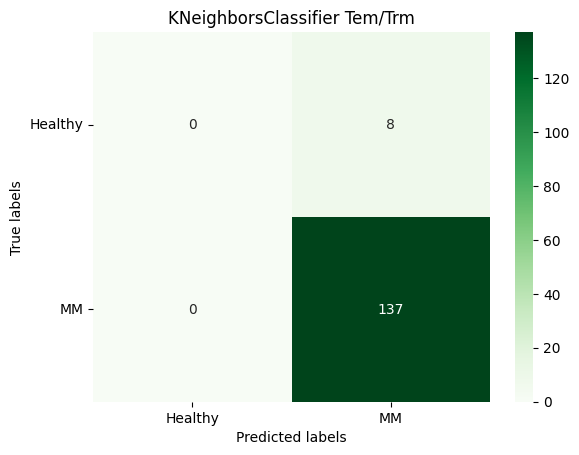

NK16cells
KNeighborsClassifier
accuracy 0.84
f1 score 0.91
ROC AUC 0.5
PR AUC 0.84
[0.88, 0.9, 0.89, 0.94, 0.84]


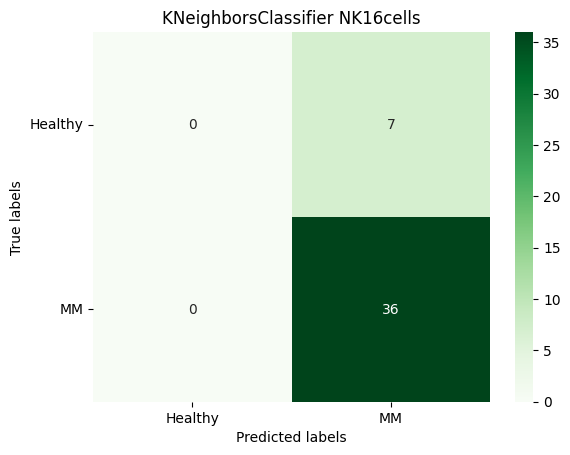

Plasmacells
KNeighborsClassifier
accuracy 0.89
f1 score 0.93
ROC AUC 0.79
PR AUC 0.88
[0.88, 0.9, 0.89, 0.94, 0.84, 0.88]


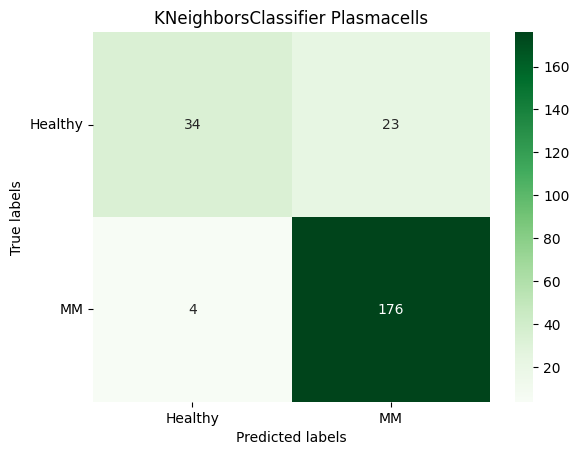

In [169]:
import seaborn as sns
from sklearn.metrics import average_precision_score, precision_recall_curve
from sklearn.metrics import balanced_accuracy_score
from sklearn.metrics import f1_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn import model_selection
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
from sklearn.metrics import make_scorer, f1_score, accuracy_score, roc_auc_score, average_precision_score, matthews_corrcoef, confusion_matrix
import xgboost as xgb

# three model variables with middle parameters as possible
#clf1 = GaussianNB()
clf1 = RandomForestClassifier(random_state=0, n_jobs=20, n_estimators=200, class_weight="balanced_subsample")
clf2 = LogisticRegression(max_iter=1000, C=0.001,  class_weight="balanced", solver="liblinear")
clf3 = KNeighborsClassifier(n_neighbors=27)
#clf5 = SVC(kernel='poly', degree=2)
#clf6 = xgb.XGBClassifier()


models =[clf1, clf2, clf3]

# use of 5 quality metrics to be used in k fold cross validation
scoring = {'acc' : make_scorer(accuracy_score),
           'f1' : make_scorer(f1_score), 
           'roc_auc' : make_scorer(roc_auc_score),
           'PR_auc' : make_scorer(average_precision_score),
           'matcf': make_scorer(matthews_corrcoef)}

# loop through the three models and fit all X, y and evaluate the model using 5 kfold cross validation
# and store each type of score range in a list then store total scores for each model in a dictionary
scores = {}
cell_names = ["Tem/effector H", "Tem/temra", "Tcm/naive", "Tem/Trm", "NK16cells", "Plasmacells"]


for clf in models:
    # Fine-tune the hyperparameters
    score = []
    for i, cell in enumerate(cells):
        print(cell_names[i])
        X = cell.X
        y = cell.obs.stage
        y.replace(to_replace=['Healthy', 'MM'], value=[0,1],inplace=True)
        y.value_counts()
        labels = ['Healthy', 'MM']
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
        clf.fit(X_train, y_train)

    # Make predictions using the optimised parameters
        clf_pred = clf.predict(X_test)
        
        print(clf.__class__.__name__)
        print("accuracy", round(accuracy_score(y_test, clf_pred), 2))
        print("f1 score", round(f1_score(y_test, clf_pred), 2))
        print("ROC AUC", round(roc_auc_score(y_test, clf_pred), 2))
        print("PR AUC", round(average_precision_score(y_test, clf_pred), 2))
        score.append(round(average_precision_score(y_test, clf_pred), 2))
        print(score)
        scores[clf.__class__.__name__] = score
        cm = confusion_matrix(y_test, clf_pred)

        ax = plt.subplot()
        sns.heatmap(cm, annot=True, ax = ax, fmt='g', cmap='Greens') 

    # labels, title and ticks
        ax.set_xlabel('Predicted labels')
        ax.set_ylabel('True labels') 
        ax.set_title(str(clf.__class__.__name__) + " " + cell_names[i]) 
        ax.xaxis.set_ticklabels(labels) 
        ax.yaxis.set_ticklabels(labels, rotation=360);
        plt.show()
    print("=============================================================================")
    print("=============================================================================")

In [170]:
scores

{'RandomForestClassifier': [0.91, 0.93, 0.92, 0.95, 0.87, 0.88],
 'LogisticRegression': [0.89, 0.96, 0.94, 0.97, 0.9, 0.95],
 'KNeighborsClassifier': [0.88, 0.9, 0.89, 0.94, 0.84, 0.88]}

#### plot the scores for models using PR AUC 

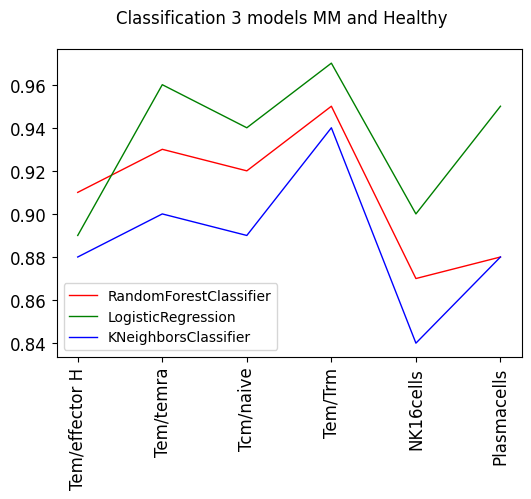

In [171]:
fig = plt.figure(figsize =(6, 4))
fig.suptitle('Classification 3 models MM and Healthy')
ax = fig.add_subplot()
bp = plt.plot(cell_names, scores["RandomForestClassifier"], color='red', label="RandomForestClassifier", lw=1)
bp = plt.plot(cell_names, scores["LogisticRegression"], color='green', label='LogisticRegression', lw=1)
bp = plt.plot(cell_names, scores["KNeighborsClassifier"], color='blue', label='KNeighborsClassifier', lw=1)
ax.set_xticklabels(cell_names)
plt.xticks(fontsize=12, rotation=90)
plt.yticks(fontsize=12)
plt.legend(loc=3, prop={'size': 10})
plt.show()


#### Feature extraction using logistic regression model and plot their importance for classification between MM and Healthy

Tem/effector H
                0
INPP4B   0.035549
LEF1     0.026701
ITGB1    0.024883
NOSIP    0.024801
IL7R     0.023250
LTB      0.022159
IFITM1   0.021284
KRTCAP2  0.020641
PBXIP1   0.020045
SLC40A1  0.020024


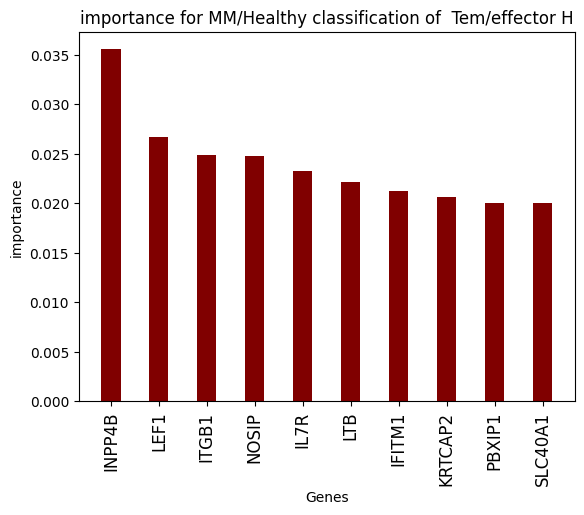

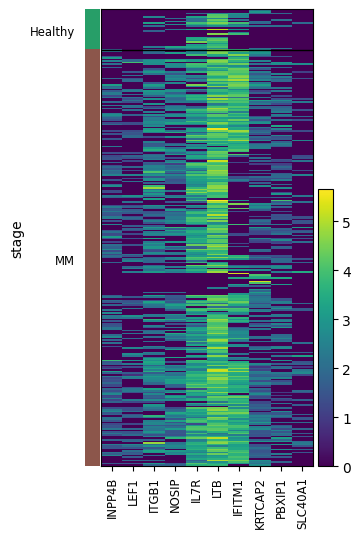

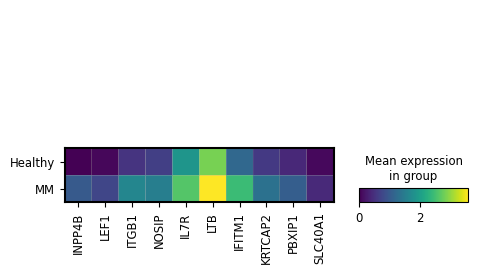

Tem/temra
                 0
HLA-DRB1  0.047427
CX3CR1    0.040965
CD8A      0.039952
ATP6V0C   0.038827
HLA-DPA1  0.038823
IFNG      0.037774
MCRIP1    0.036444
SELENOK   0.035951
IFITM1    0.035340
HLA-DRB5  0.033971


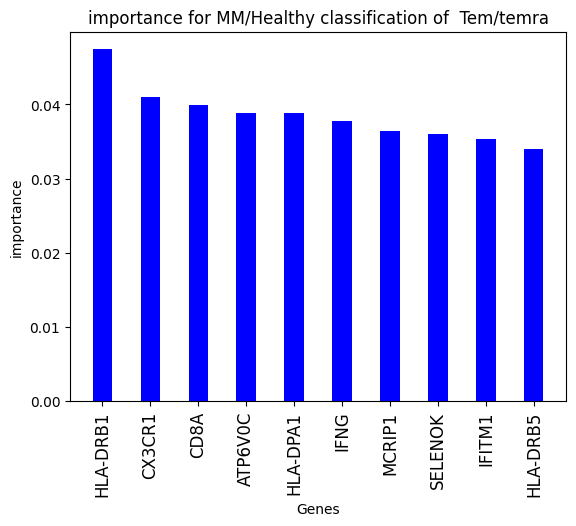

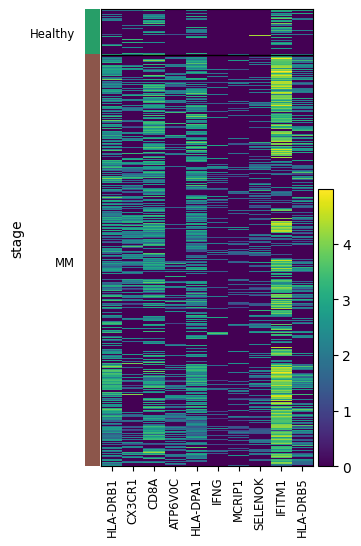

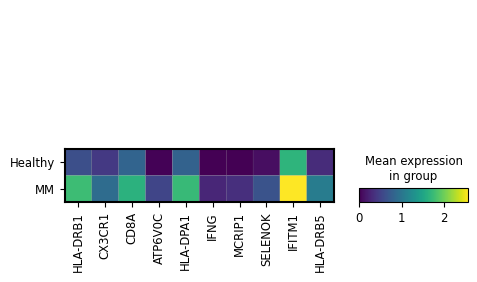

Tcm/naive
               0
SNHG32  0.057410
TLE5    0.052300
PLAAT4  0.044966
H3-3B   0.044203
MAL     0.042443
IL7R    0.041455
H3-3A   0.041216
BEX3    0.040524
ATP5MJ  0.039724
CDC14A  0.035415


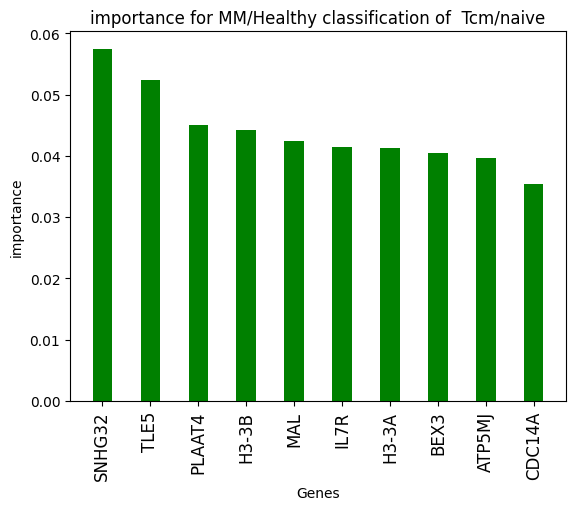

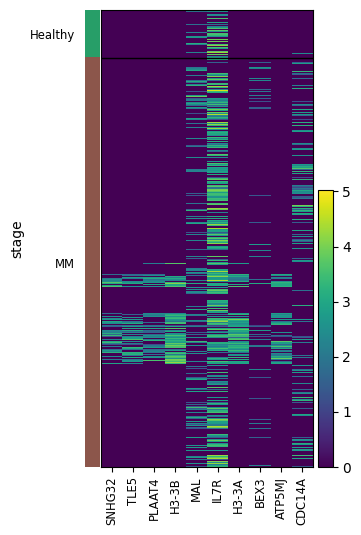

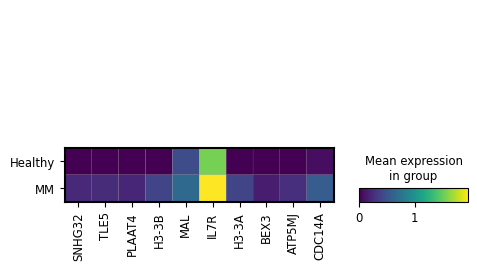

Tem/Trm
                 0
GZMK      0.059372
DUSP2     0.048397
GZMA      0.036704
CEMIP2    0.032137
CD8A      0.031019
SYNE1     0.029254
HLA-DPB1  0.028160
TGFBR3    0.027039
HLA-DPA1  0.025305
RNF213    0.024758


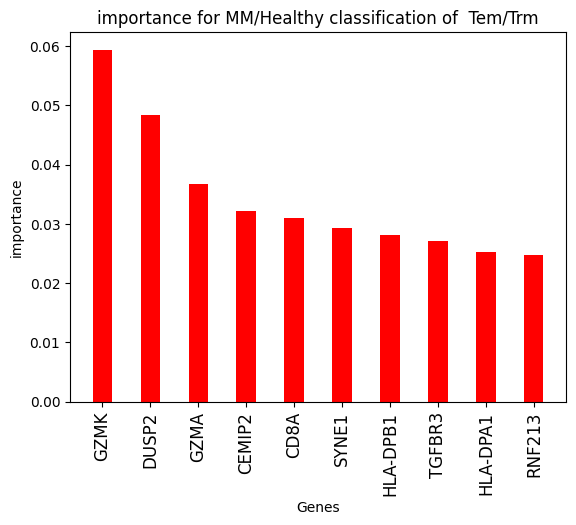

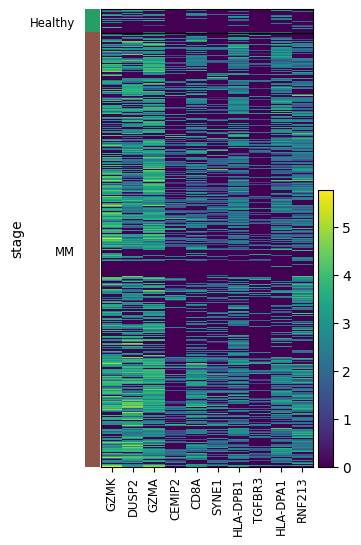

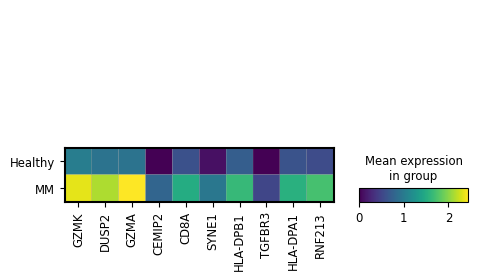

NK16cells
                0
KIR3DL1  0.025732
H3-3B    0.025479
PLAAT4   0.024821
H3-3A    0.022954
AREG     0.020559
B3GNT7   0.020480
CMC1     0.020093
KLRC1    0.019863
ATP5MJ   0.018418
TLE5     0.017670


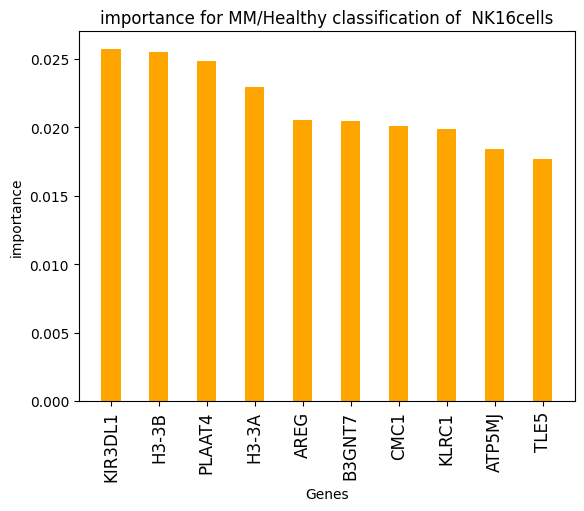

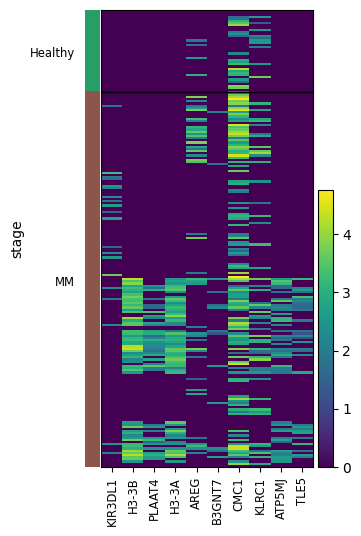

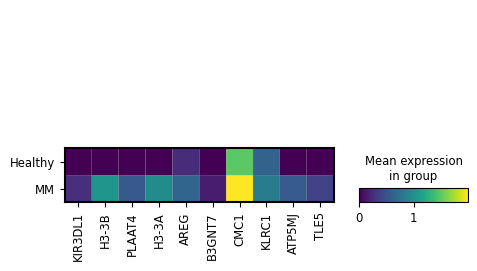

Plasmacells
               0
IFI27   0.065070
FRZB    0.049783
NEB     0.049327
MLLT3   0.040182
MYEOV   0.040096
IFI6    0.039345
UCHL1   0.038574
IGF1    0.035453
LAMP5   0.034240
TENT5C  0.033607


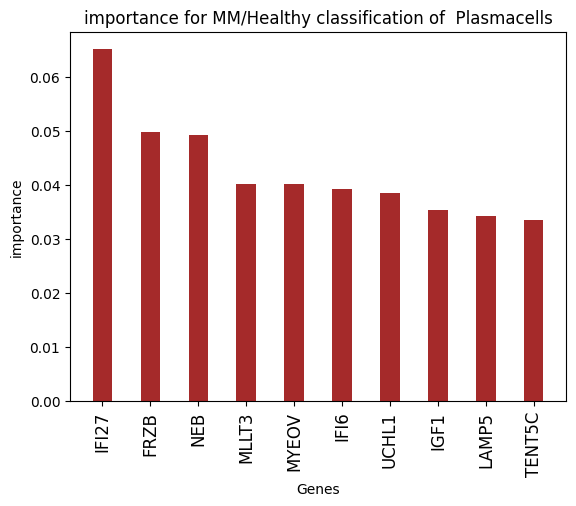

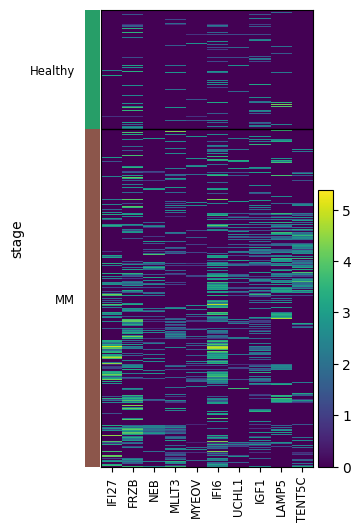

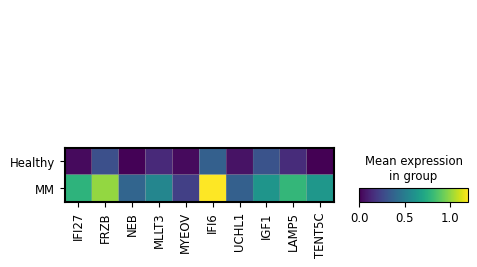

In [172]:
colors = ["maroon", "blue", "green", "red", "orange", "brown"]
for i, cell in enumerate(cells):
    print(cell_names[i])
    X = cell.X
    y = cell.obs.stage
    y.replace(to_replace=['Healthy', 'MM'], value=[0,1],inplace=True)
    clf = LogisticRegression(max_iter=1000, C=0.001,  class_weight="balanced", solver="liblinear")

# fit the model on the training data
    clf.fit(X, y)
    df = pd.DataFrame(clf.coef_, columns = cell.var_names).T
    df2 = df.sort_values(df.columns[0], ascending = False)[:10]

    print(df2)
    plt.bar(df2.index, df2[df.columns[0]], color =colors[i],
        width = 0.4)
    plt.xticks(fontsize=12, rotation=90)
    plt.xlabel("Genes")
    plt.ylabel("importance")
    plt.title("importance for MM/Healthy classification of  " + cell_names[i])
    plt.show()
    y.replace(to_replace=[0,1], value=['Healthy', 'MM'],inplace=True)
    ax = sc.pl.heatmap(cell,df2.index, groupby='stage', var_group_labels=["Healthy", "MM"], show=True)
    ax = sc.pl.matrixplot(cell,df2.index, groupby='stage', var_group_labels=["Healthy", "MM"], show=True)


### Biomarker identification of MM vs Healthy without regarding cell types

RandomForestClassifier
accuracy 0.89
f1 score 0.94
ROC AUC 0.66
PR AUC 0.89
[0.89]


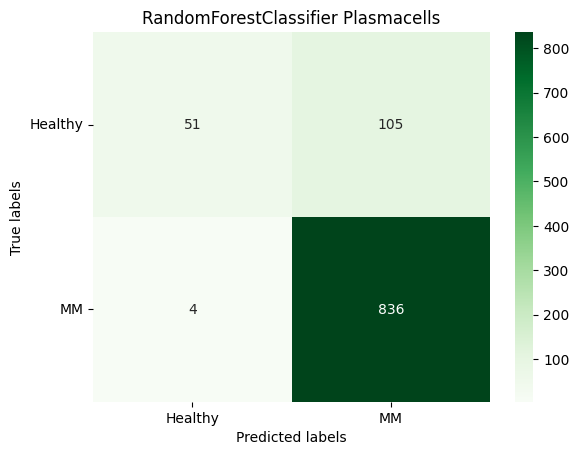

LogisticRegression
accuracy 0.67
f1 score 0.77
ROC AUC 0.72
PR AUC 0.91
[0.91]


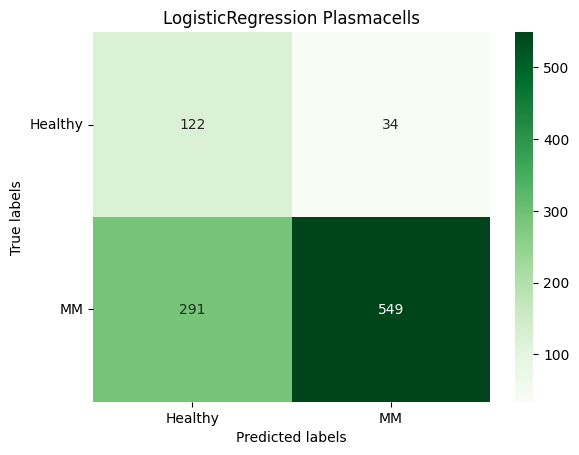

KNeighborsClassifier
accuracy 0.84
f1 score 0.92
ROC AUC 0.5
PR AUC 0.84
[0.84]


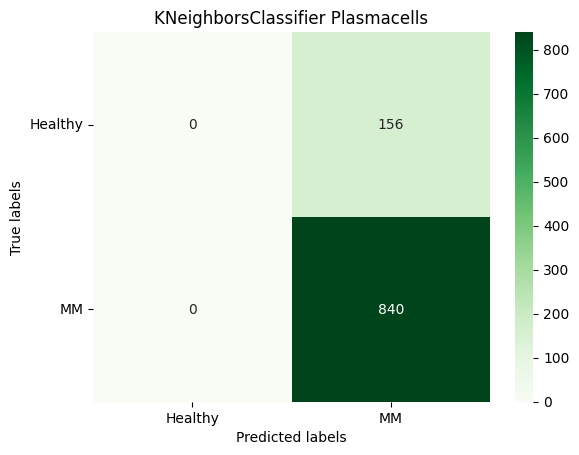

In [176]:
clf1 = RandomForestClassifier(random_state=0, n_jobs=20, n_estimators=200, class_weight="balanced_subsample")
clf2 = LogisticRegression(max_iter=1000, C=0.0001,  class_weight="balanced", solver="liblinear")
clf3 = KNeighborsClassifier(n_neighbors=27)
#clf5 = SVC(kernel='poly', degree=2)
#clf6 = xgb.XGBClassifier()


models =[clf1, clf2, clf3]

# use of 5 quality metrics to be used in k fold cross validation
scoring = {'acc' : make_scorer(accuracy_score),
           'f1' : make_scorer(f1_score), 
           'roc_auc' : make_scorer(roc_auc_score),
           'PR_auc' : make_scorer(average_precision_score),
           'matcf': make_scorer(matthews_corrcoef)}

# loop through the three models and fit all X, y and evaluate the model using 5 kfold cross validation
# and store each type of score range in a list then store total scores for each model in a dictionary
scores = {}


for clf in models:
    # Fine-tune the hyperparameters
        score = []
        X = adata_sub.X
        y = adata_sub.obs.stage
        y.replace(to_replace=['Healthy', 'MM'], value=[0,1],inplace=True)
        y.value_counts()
        labels = ['Healthy', 'MM']
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
        clf.fit(X_train, y_train)

    # Make predictions using the optimised parameters
        clf_pred = clf.predict(X_test)
        
        print(clf.__class__.__name__)
        print("accuracy", round(accuracy_score(y_test, clf_pred), 2))
        print("f1 score", round(f1_score(y_test, clf_pred), 2))
        print("ROC AUC", round(roc_auc_score(y_test, clf_pred), 2))
        print("PR AUC", round(average_precision_score(y_test, clf_pred), 2))
        score.append(round(average_precision_score(y_test, clf_pred), 2))
        print(score)
        scores[clf.__class__.__name__] = score
        cm = confusion_matrix(y_test, clf_pred)

        ax = plt.subplot()
        sns.heatmap(cm, annot=True, ax = ax, fmt='g', cmap='Greens') 

    # labels, title and ticks
        ax.set_xlabel('Predicted labels')
        ax.set_ylabel('True labels') 
        ax.set_title(str(clf.__class__.__name__) + " " + cell_names[i]) 
        ax.xaxis.set_ticklabels(labels) 
        ax.yaxis.set_ticklabels(labels, rotation=360);
        plt.show()
    

                0
H3-3B    0.122968
H3-3A    0.119508
ATP5MJ   0.096118
TLE5     0.092427
SNHG32   0.081676
IFI27    0.075157
SELENOK  0.074950
PLAAT4   0.074201
OGA      0.072429
GNAS     0.059300


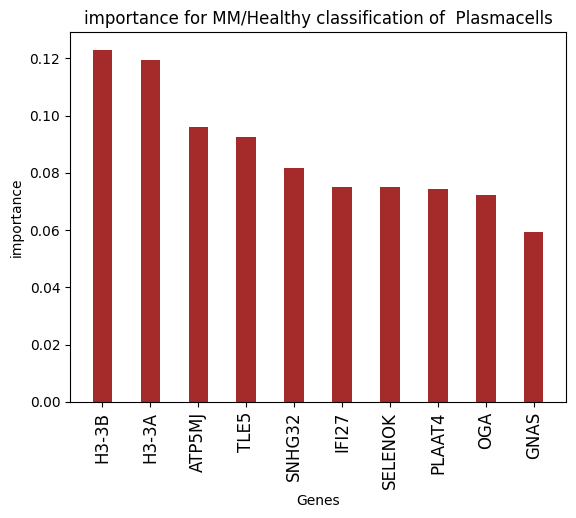

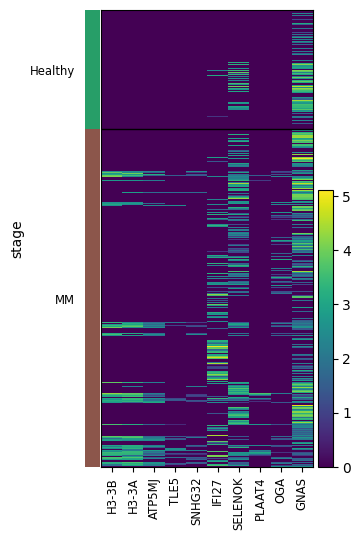

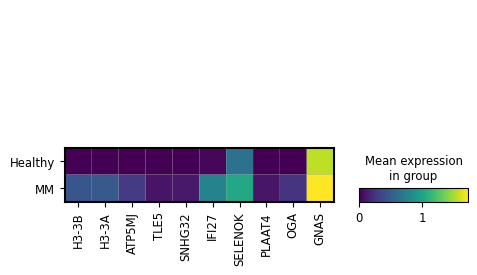

In [177]:
X = adata_sub.X
y = adata_sub.obs.stage
y.replace(to_replace=['Healthy', 'MM'], value=[0,1],inplace=True)
clf = LogisticRegression(max_iter=1000, C=0.001,  class_weight="balanced", solver="liblinear")

# fit the model on the training data
clf.fit(X, y)
df = pd.DataFrame(clf.coef_, columns = cell.var_names).T
df2 = df.sort_values(df.columns[0], ascending = False)[:10]

print(df2)
plt.bar(df2.index, df2[df.columns[0]], color =colors[i],
        width = 0.4)
plt.xticks(fontsize=12, rotation=90)
plt.xlabel("Genes")
plt.ylabel("importance")
plt.title("importance for MM/Healthy classification of  " + cell_names[i])
plt.show()
y.replace(to_replace=[0,1], value=['Healthy', 'MM'],inplace=True)
ax = sc.pl.heatmap(cell,df2.index, groupby='stage', var_group_labels=["Healthy", "MM"], show=True)
ax = sc.pl.matrixplot(cell,df2.index, groupby='stage', var_group_labels=["Healthy", "MM"], show=True)